In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from matplotlib.patches import FancyBboxPatch
import gzip
import time
from scipy.optimize import curve_fit
from scipy.interpolate import interp1d
from scipy.optimize import curve_fit

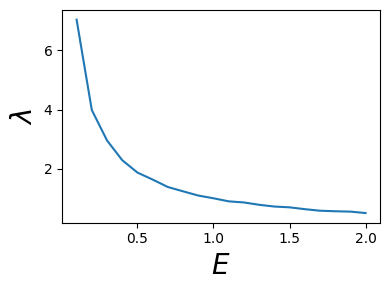

In [12]:
df = pd.read_csv('Data/09-1265A-E_Advantage_system5_4_annealing_schedule.csv', sep=',', decimal='.')
sa = np.array([round(df['s'][i],3) for i in range(1000)])
Ga = np.array([round(df['A(s) (GHz)'][i],3)*np.pi for i in range(1000)])
Ja = np.array([round(df['B(s) (GHz)'][i],3)*np.pi for i in range(1000)])
gc = 3.04438

def sc(E,gc=1.):
    return sa[np.argmin(abs(Ga-gc*E*Ja))]
def Jc(E,gc=1.):
    return E * Ja[np.argmin(abs(Ga-gc*E*Ja))]
def Gc(E,gc=1.):
    return Ga[np.argmin(abs(Ga-gc*E*Ja))]
def Jcp(E,gc=1.):
    return np.gradient(E*Ja,sa)[np.argmin(abs(Ga-gc*E*Ja))]
def Gcp(E,gc=1.):
    return np.gradient(Ga,sa)[np.argmin(abs(Ga-gc*E*Ja))]
def tQ(ta,E,gc=1.):
    # ta must be in ns
    return ta / gc * Jc(E,gc) / (Jcp(E,gc)/Jc(E,gc) - Gcp(E,gc)/Gc(E,gc))
def tQ_to_ta(tq,E,gc=1.):
    # ta must be in ns
    return tq * gc / Jc(E,gc) * (Jcp(E,gc)/Jc(E,gc) - Gcp(E,gc)/Gc(E,gc))
def hcoJc(h,E,gc=1.):
    return h
def hcoJc_to_hz(hcoJc,E,gc=1.):
    return hcoJc
def en_to_lambda(E,gc=1.):
    return ((Jcp(E,gc)/Jc(E,gc) - Gcp(E,gc)/Gc(E,gc)) / Jc(E,gc)) / ((Jcp(1.,gc)/Jc(1.,gc) - Gcp(1.,gc)/Gc(1.,gc)) / Jc(1.,gc))

en_range = np.linspace(.1,2.,20).round(6)

ens, ens1, tqs, tas, hcojs, hzs = [], [], [], [], [], []
for en in en_range:
    for tq in np.geomspace(tQ(5,.1,gc=gc),tQ(100,2.,gc=gc),40):
        if tQ(5,en,gc=gc) < tq < tQ(100,en,gc=gc):
            for hz in np.geomspace(hcoJc(-1.,.1,gc=gc), hcoJc(-.01,.1,gc=gc), 12):
                if hcoJc(-1.,en,gc=gc) <= hz <= hcoJc(-.0,en,gc=gc):
                    hcojs.append(hz.round(6))
                    hzs.append(hcoJc_to_hz(hz,en,gc=gc).round(6))
                    ens.append(en.round(6))
                    tqs.append(tq.round(6))
                    tas.append((tQ_to_ta(tq,en,gc=gc)/1000.).round(6))

fig, ax = plt.subplots(figsize=(4,3))
plt.xlabel('$E$', fontsize = 20)
plt.ylabel(r'$\lambda$', fontsize = 20)
ax.plot(en_range, [en_to_lambda(e,gc=gc) for e in en_range])
fig.tight_layout()
fig.savefig('Figs/lambdavsE.pdf')

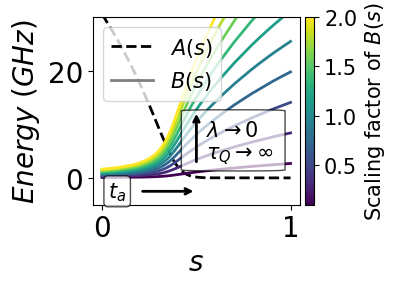

In [13]:
# Define scale factors and colormap
factors = np.linspace(0.1, 2.0, 10)
norm = mcolors.Normalize(vmin=min(factors), vmax=max(factors))
cmap = cm.viridis
colors = [cmap(norm(f)) for f in factors]

# Create figure and axis
fig, ax = plt.subplots(figsize=(4, 3))
ax.set_xlabel('$s$', fontsize=20)
ax.set_ylabel('$Energy$ $(GHz)$', fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=20)

# Plot A(s)
ax.plot(sa, Ga, label='$A(s)$', color='black', linestyle='--', lw=2)

# Plot scaled B(s)
for i, f in enumerate(factors):
    ax.plot(sa, f * Ja, color=colors[i], lw=2)

# Legend: only A(s) and B(s)
custom_lines = [
    plt.Line2D([0], [0], color='black', linestyle='--', lw=2, label='$A(s)$'),
    plt.Line2D([0], [0], color='gray', linestyle='-', lw=2, label='$B(s)$')
]
ax.legend(handles=custom_lines, fontsize=15)

# Colorbar for scaling of B(s)
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, pad=0.02)
cbar.set_label(label='Scaling factor of $B(s)$', size=15)
cbar.ax.tick_params(labelsize=15)

# --- Combined box, arrow and text for lambda/tauQ ---
arrow_x = 0.5
arrow_y = 2.5
arrow_dy = 10

# Dimensions for the box
box_left = arrow_x + .12
box_bottom = arrow_y - 1.
box_width = 0.15
box_height = arrow_dy + 1

# Draw background box manually
box = FancyBboxPatch(
    (box_left, box_bottom), box_width, box_height,
    boxstyle="round,pad=0.2", edgecolor='black', facecolor='white', alpha=0.7, zorder=2
)
ax.add_patch(box)

# Add arrow inside the box
ax.annotate(
    '', xy=(arrow_x, arrow_y + arrow_dy), xytext=(arrow_x, arrow_y),
    arrowprops=dict(arrowstyle='->', lw=2, color='black'), zorder=3
)

# Add text inside the box
ax.text(
    arrow_x + 0.05, arrow_y + arrow_dy - 6.,
    r'$\lambda \to 0$' + '\n' + r'$\tau_Q \to \infty$',
    fontsize=15, verticalalignment='center', zorder=3
)

# --- Horizontal arrow for t_a ---
ta_arrow_y = -2.5
ax.annotate(
    '', xy=(0.5, ta_arrow_y), xytext=(0.2, ta_arrow_y),
    arrowprops=dict(arrowstyle='->', lw=2, color='black'), zorder=1
)

ax.text(
    .08, ta_arrow_y ,
    r'$t_a$', fontsize=15, ha='center', va='center', zorder=3,
    bbox=dict(boxstyle='round,pad=0.2', facecolor='white', edgecolor='black', alpha=0.7)
)

# Final formatting
ax.set_ylim(-5., 30.)
fig.tight_layout()
fig.savefig('Figs/AnnealingScheduleTauLambda.pdf')
plt.show()

In [14]:
# PARAMETER DEFINITIONS AND LOADING DATA FOR PLOTTING

df = pd.read_csv('Data/09-1265A-E_Advantage_system5_4_annealing_schedule.csv', sep=',', decimal='.')
sa = np.array([round(df['s'][i],3) for i in range(1000)])
Ga = np.array([round(df['A(s) (GHz)'][i],3)*np.pi for i in range(1000)])
Ja = np.array([round(df['B(s) (GHz)'][i],3)*np.pi for i in range(1000)])

def sc(E,gc=1.):
    return sa[np.argmin(abs(Ga-gc*E*Ja))]
def Jc(E,gc=1.):
    return E * Ja[np.argmin(abs(Ga-gc*E*Ja))]
def Gc(E,gc=1.):
    return Ga[np.argmin(abs(Ga-gc*E*Ja))]
def Jcp(E,gc=1.):
    return np.gradient(E*Ja,sa)[np.argmin(abs(Ga-gc*E*Ja))]
def Gcp(E,gc=1.):
    return np.gradient(Ga,sa)[np.argmin(abs(Ga-gc*E*Ja))]
def tQ(ta,E,gc=1.):
    # ta must be in ns
    return ta / gc * Jc(E,gc) / (Jcp(E,gc)/Jc(E,gc) - Gcp(E,gc)/Gc(E,gc))
def tQ_to_ta(tq,E,gc=1.):
    # ta must be in ns
    return tq * gc / Jc(E,gc) * (Jcp(E,gc)/Jc(E,gc) - Gcp(E,gc)/Gc(E,gc))
def hcoJc(h,E,gc=1.):
    return h
def hcoJc_to_hz(hcoJc,E,gc=1.):
    return hcoJc
def en_to_lambda(E,gc=1.):
    return ((Jcp(E,gc)/Jc(E,gc) - Gcp(E,gc)/Gc(E,gc)) / Jc(E,gc)) / ((Jcp(1.,gc)/Jc(1.,gc) - Gcp(1.,gc)/Gc(1.,gc)) / Jc(1.,gc))

en_range = np.linspace(.1,2.,20).round(6)
            
ens, ens1, tqs, tas, hcojs, hzs = [], [], [], [], [], []
for en in en_range:
    for tq in np.geomspace(tQ(5,.1),tQ(100,2.),40):
        if tQ(5,en) < tq < tQ(100,en):
            for hz in np.concatenate((np.geomspace(hcoJc(-.1,.1), hcoJc(-.01,.1), 12),
                                      np.geomspace(hcoJc(-1.,.1), hcoJc(-.11,.1), 12))):
                if hcoJc(-1.,en) <= hz <= hcoJc(-0.,en):
                    hcojs.append(hz.round(6))
                    hzs.append(hcoJc_to_hz(hz,en).round(6))
                    ens.append(en.round(6))
                    tqs.append(tq.round(6))
                    tas.append((tQ_to_ta(tq,en)/1000.).round(6))

L = 5564
J = -1.

hzenta_range = [[ens[i],tas[i],hzs[i]] for i in range(len(ens))]

profil = 'jvodebjuelich'
num_reads = 1000
embedding_string_short = '54chainPBC'
auto_scale = False
answer_mode="raw"
fast_anneal=True

#ds = range(0,L//2+1)
ds = range(0,1)

# READ ANALYZED RESULTS

with gzip.open('Data/1D_tfim_1st_sweep_mag.txt.gz', "r") as f:
    fvd_mags = eval(f.read())
with gzip.open('Data/1D_tfim_1st_sweep_corr.txt.gz', "r") as f:
    fvd_corrs = eval(f.read())

# PLOTTING CONVERSION

tqsu = np.unique(tqs)
hcojcsu = np.unique(hcojs)
datamag = {}
datanex = {}
keys = []
for tq in tqsu:
    for hcojc in hcojcsu:
        datamag[(tq,hcojc)] = []
        datanex[(tq,hcojc)] = []
        keys.append((tq,hcojc))

for hzentaind, [en,ta,hz] in enumerate(hzenta_range):

    try:
        tq = tqsu[np.abs(tQ(1000*ta,en).round(6) - tqsu).argmin()]
        hcojc = hcojcsu[np.abs(hcoJc(hz,en) - hcojcsu).argmin()]
        datamag[(tq,hcojc)].append([en_to_lambda(en),fvd_mags[(L,J,hz,ta,en,num_reads,'szmean')]])
        datanex[(tq,hcojc)].append([en_to_lambda(en),fvd_mags[(L,J,hz,ta,en,num_reads,'nexmean')]])
    except:
        continue

for key in keys:
    if datamag[key] == []:
        del datamag[key]
        del datanex[key]
        print(key)

# PLOTTING CONVERSION

mag = {}
nex = {}
corr = {}

for hzentaind, [en,ta,hz] in enumerate(hzenta_range):
    try:
        mag[(hz,ta,en)] = fvd_mags[(L,J,hz,ta,en,num_reads,'szmean')]
        nex[(hz,ta,en)] = fvd_mags[(L,J,hz,ta,en,num_reads,'nexmean')]

        for d in ds:
            corr[(hz,ta,en,d)] = fvd_corrs[(L,J,hz,ta,en,num_reads,d,'szsz'+str(d)+'mean')]
    except:
        continue

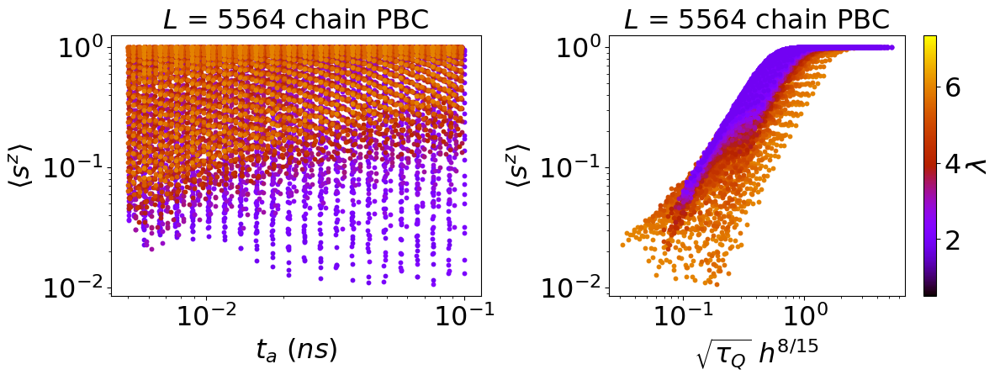

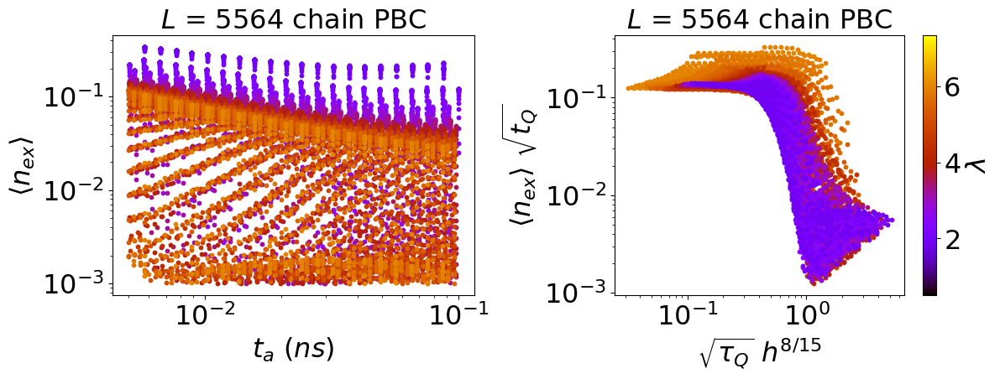

In [15]:
# PLOT RESULTS

lambdas = np.array([en_to_lambda(e) for e in en_range])
third_axis = np.flip(np.unique(lambdas))
third_axis_name = r'$\lambda$'

cmap = plt.get_cmap('gnuplot')
colors = np.array([cmap(i) for i in np.linspace(.2, .8, len(third_axis))])

lw = .5
s = 10

xnex, ynex, xsz, ysz = np.array([]), np.array([]), np.array([]), np.array([])
xmean = .15
    
figsz, axsz = plt.subplots(1,2,figsize=(12,5))
axsz[0].set_xlabel("$t_a$ ($ns$)", fontsize = 23)
axsz[0].tick_params(axis='x',labelsize=23)
axsz[0].tick_params(axis='y',labelsize=23)
axsz[0].set_ylabel(r"$\langle s^z\rangle$", fontsize=23)
axsz[0].set_title('$L$ = '+str(L)+' chain PBC', fontsize = 23)
axsz[1].set_xlabel(r"$\sqrt{\tau_Q}$ $h^{8/15}$", fontsize = 23)
axsz[1].tick_params(axis='x',labelsize=23)
axsz[1].tick_params(axis='y',labelsize=23)
axsz[1].set_ylabel(r"$\langle s^z\rangle$", fontsize=23)
axsz[1].set_title('$L$ = '+str(L)+' chain PBC', fontsize = 23)

fignex, axnex = plt.subplots(1,2,figsize=(12,5))
axnex[0].set_xlabel("$t_a$ ($ns$)", fontsize = 23)
axnex[0].tick_params(axis='x',labelsize=23)
axnex[0].tick_params(axis='y',labelsize=23)
axnex[0].set_ylabel(r"$\langle n_{ex}\rangle$", fontsize=23)
axnex[0].set_title('$L$ = '+str(L)+' chain PBC', fontsize = 23)
axnex[1].set_xlabel(r"$\sqrt{\tau_Q}$ $h^{8/15}$", fontsize = 23)
axnex[1].tick_params(axis='x',labelsize=23)
axnex[1].tick_params(axis='y',labelsize=23)
axnex[1].set_ylabel(r"$\langle n_{ex}\rangle$ $\sqrt{t_Q}$", fontsize=23)
axnex[1].set_title('$L$ = '+str(L)+' chain PBC', fontsize = 23)

for taxind, tax in enumerate(en_range):
    for hzind, hz in enumerate(np.unique(hzs)):
        
        tas1 = np.unique(np.array(tas))
        tqs = np.array([tQ(ta*1000,tax) for ta in tas1])
        mag1 = np.full(len(tas1),-2.)
        nex1 = np.full(len(tas1),-2.)
        for taind, ta in enumerate(tas1):
            try:
                if mag[(hz,ta,tax)] > 10**-2:
                    mag1[taind] = mag[(hz,ta,tax)]
                else:
                    mag1[taind] = np.nan
                if nex[(hz,ta,tax)] > 10**-3:
                    nex1[taind] = nex[(hz,ta,tax)]
                else:
                    nex1[taind] = np.nan
            except:
                mag1[taind] = np.nan
                nex1[taind] = np.nan

        axsz[0].scatter(tas1,mag1, color=colors[taxind], s=s)
        axsz[0].plot(tas1,mag1, color=colors[taxind], lw=lw)
        axsz[1].scatter(np.sqrt(tqs)*abs(hz)**(8/15), mag1, color=colors[len(en_range)-1-taxind], s=s)
        #axsz[1].plot(np.sqrt(tqs)*abs(en*tax/Jc(en))**(8/15),mag[taxind,:,enind], color=colors[taxind], lw=lw)
        axnex[0].scatter(tas1,nex1, color=colors[taxind], s=s)
        axnex[0].plot(tas1,nex1, color=colors[taxind], lw=lw)
        axnex[1].scatter(np.sqrt(tqs)*abs(hz)**(8/15),np.sqrt(tqs)*nex1, color=colors[len(en_range)-1-taxind], s=s)
        #axnex[1].plot(np.sqrt(tqs)*abs(en*tax/Jc(en))**(8/15),np.sqrt(tqs)*nex[taxind,:,enind], color=colors[taxind], lw=lw)
        
        xtemp = np.sqrt(tqs)*abs(hz)**(8/15)
        ynextemp = np.sqrt(tqs)*nex1
        ysztemp = mag1
        for indtemp, temp in enumerate(ynextemp):
            if temp > 0:
                xnex = np.concatenate((xnex,np.array([xtemp[indtemp]])))
                ynex = np.concatenate((ynex,np.array([temp])))
                
        for indtemp, temp in enumerate(xtemp):
            if temp <= xmean and ysztemp[indtemp] > 0:
                xsz = np.concatenate((xsz,np.array([xtemp[indtemp]])))
                ysz = np.concatenate((ysz,np.array([ysztemp[indtemp]])))
        
figsz.tight_layout(pad=2.5)
fignex.tight_layout(pad=2.5)
normalize = mcolors.Normalize(vmin=max(abs(third_axis)), vmax=min(abs(third_axis)))
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=cmap)
scalarmappaple.set_array(third_axis)
cbar = plt.colorbar(scalarmappaple, ax=axsz[1])
cbar.set_label(label=third_axis_name, size='23')
cbar.ax.tick_params(labelsize='23')
cbar = plt.colorbar(scalarmappaple, ax=axnex[1])
cbar.set_label(label=third_axis_name, size='23')
cbar.ax.tick_params(labelsize='23')
axsz[0].set_xscale('log')
axsz[0].set_yscale('log')
axsz[1].set_xscale('log')
axsz[1].set_yscale('log')
axnex[0].set_xscale('log')
axnex[0].set_yscale('log')
axnex[1].set_xscale('log')
axnex[1].set_yscale('log')

In [16]:
figsz.savefig('Figs/1D_magnetization_raw_data_collected.pdf')

In [17]:
fignex.savefig('Figs/1D_defect_density_raw_data_collected.pdf')

C:\Users\jakav\AppData\Local\Temp\ipykernel_17552\1118558510.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params = curve_fit(fit_func, x, y)
C:\Users\jakav\AppData\Local\Temp\ipykernel_17552\1118558510.py:49: OptimizeWarning: Covariance of the parameters could not be estimated
  params = curve_fit(fit_func, x, y)
C:\Users\jakav\AppData\Local\Temp\ipykernel_17552\1118558510.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params = curve_fit(fit_func, x, y)
C:\Users\jakav\AppData\Local\Temp\ipykernel_17552\1118558510.py:49: OptimizeWarning: Covariance of the parameters could not be estimated
  params = curve_fit(fit_func, x, y)
C:\Users\jakav\AppData\Local\Temp\ipykernel_17552\1118558510.py:38: OptimizeWarning: Covariance of the parameters could not be estimated
  params = curve_fit(fit_func, x, y)
C:\Users\jakav\AppData\Local\Temp\ipykernel_17552\1118558510.py:49: OptimizeWarning: Covariance of the parameters could not be est

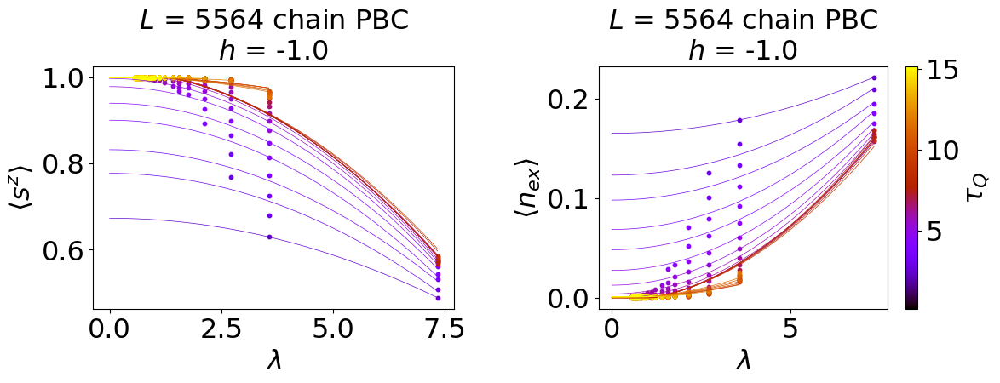

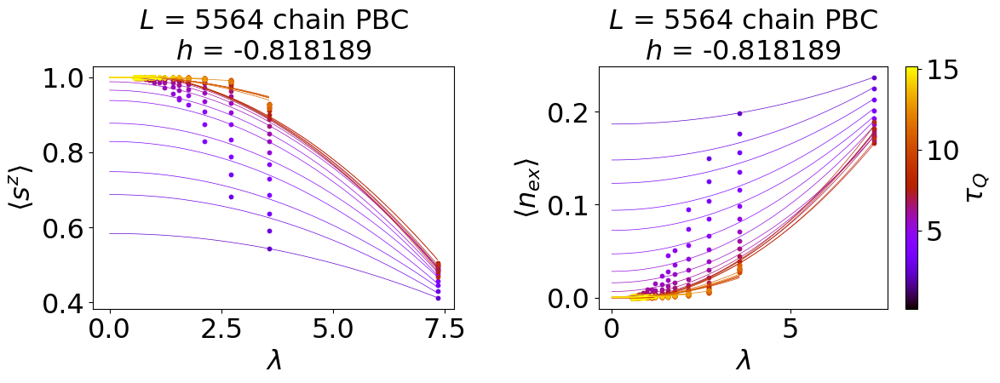

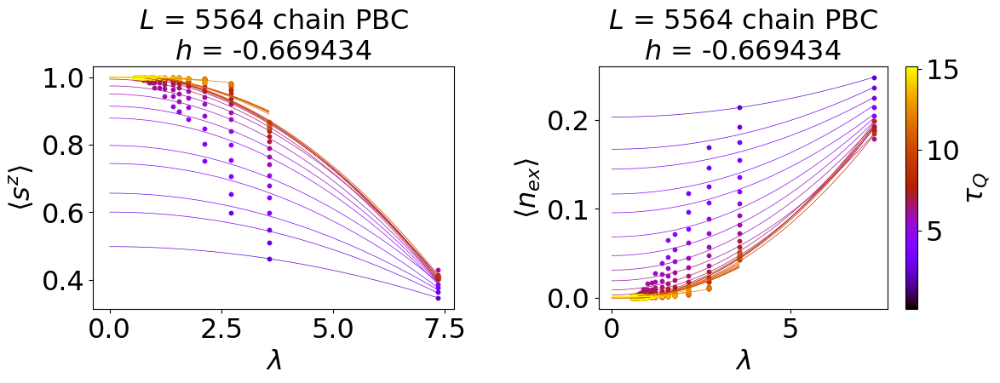

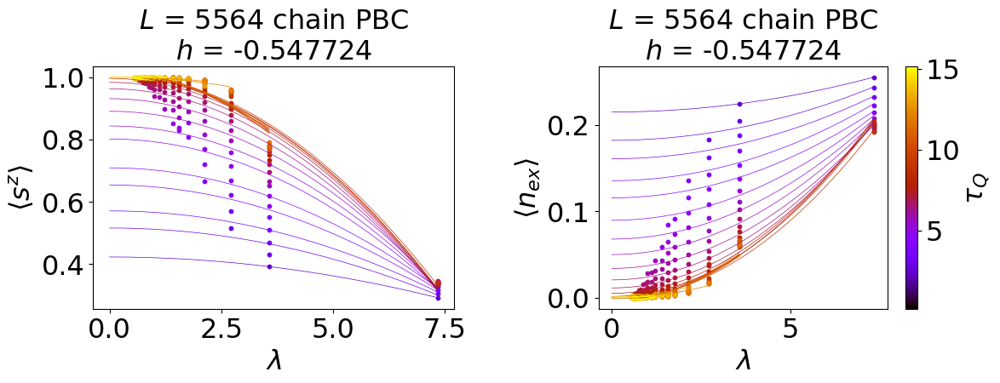

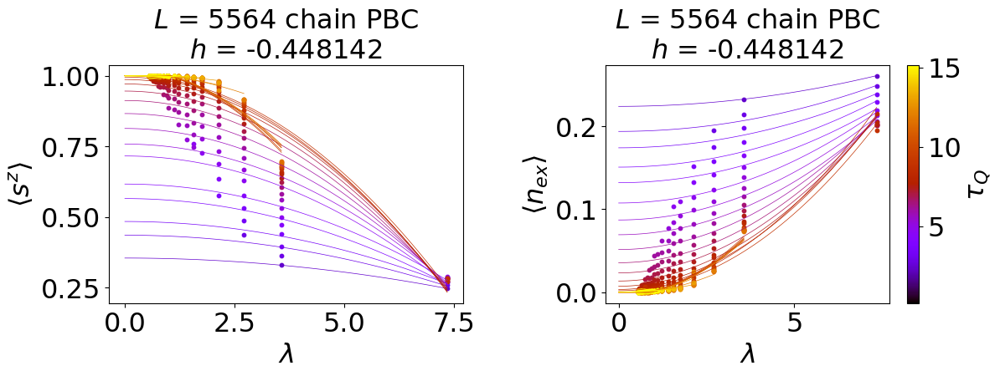

...

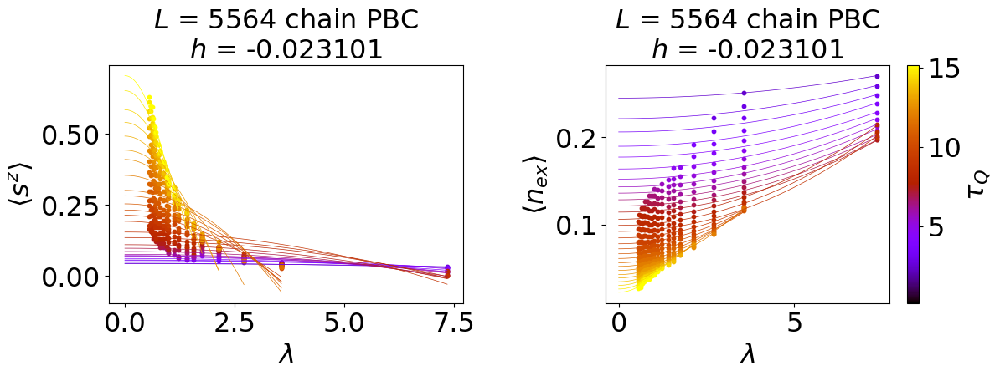

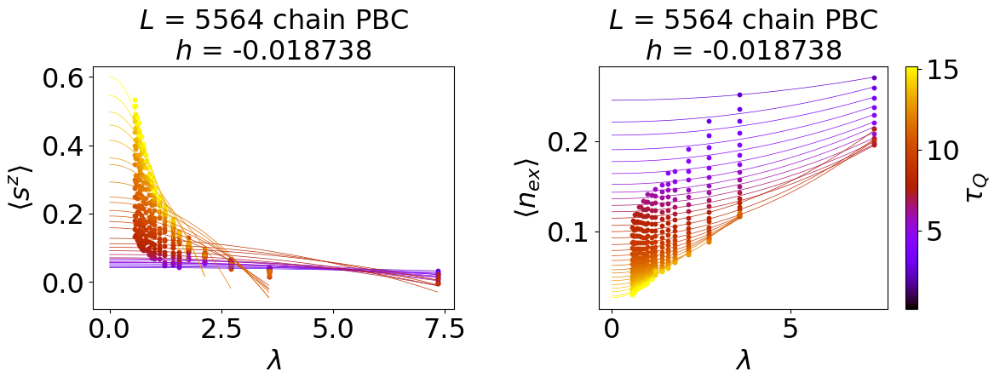

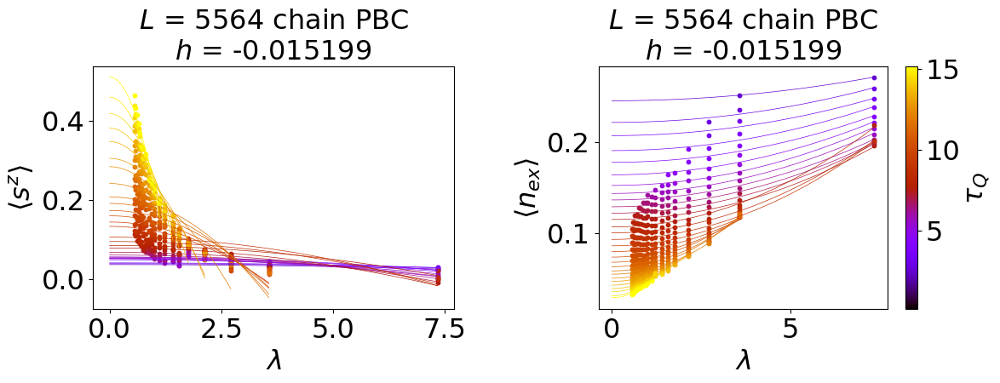

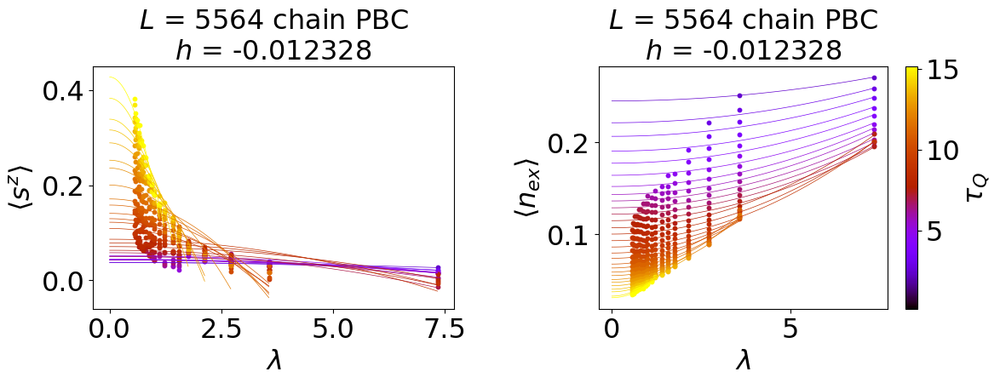

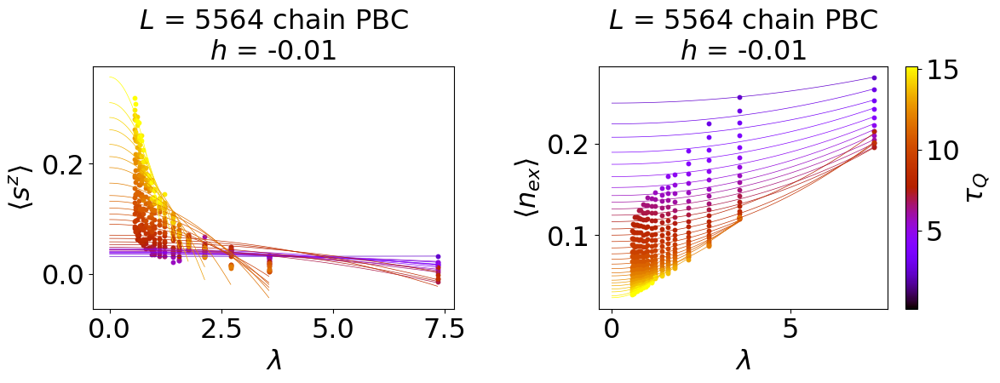

In [20]:
# PLOT RESULTS

def fit_func(x, C0, C2):
    return C0 + C2*x**2

third_axis = tqsu[:34]
third_axis_name = r'$\tau_Q$'
cmap = plt.get_cmap('gnuplot')
colors = [cmap(i) for i in np.linspace(0., 1., len(third_axis))]

lw = .5
s = 10

znemag = np.full((len(hcojcsu),len(third_axis)),-2.)
znenex = np.full((len(hcojcsu),len(third_axis)),-2.)

for hcojcind, hcojc in enumerate(hcojcsu):
    
    fig, ax = plt.subplots(1,2,figsize=(12,5))
    
    ax[0].set_xlabel(r"$\lambda$", fontsize = 23)
    ax[0].tick_params(axis='x',labelsize=23)
    ax[0].tick_params(axis='y',labelsize=23)
    ax[0].set_ylabel(r"$\langle s^z\rangle$", fontsize=23)
    ax[0].set_title('$L$ = '+str(L)+' chain PBC\n$h$ = '+str(hcojc), fontsize = 23)

    ax[1].set_xlabel(r"$\lambda$", fontsize = 23)
    ax[1].tick_params(axis='x',labelsize=23)
    ax[1].tick_params(axis='y',labelsize=23)
    ax[1].set_ylabel(r"$\langle n_{ex}\rangle$", fontsize=23)
    ax[1].set_title('$L$ = '+str(L)+' chain PBC\n$h$ = '+str(hcojc), fontsize = 23)
    
    for tqi, tq in enumerate(third_axis):
        
        try:
            x = np.array(datamag[(tq,hcojc)])[:,0]
            y = np.array(datamag[(tq,hcojc)])[:,1]
            params = curve_fit(fit_func, x, y)
            [C0, C2] = params[0]
            ax[0].scatter(x, y, color=colors[tqi], s=s)
            x = np.linspace(0.,x[0],100)
            y = [min([fit_func(xi, C0, C2),1.]) for xi in x]
            ax[0].plot(x, y, color=colors[tqi], lw=lw)
            
            znemag[hcojcind,tqi] = min([fit_func(0., C0, C2),1.])

            x = np.array(datanex[(tq,hcojc)])[:,0]
            y = np.array(datanex[(tq,hcojc)])[:,1]
            params = curve_fit(fit_func, x, y)
            [C0, C2] = params[0]
            ax[1].scatter(x, y, color=colors[tqi], s=s)
            x = np.linspace(0.,x[0],100)
            y = [max([fit_func(xi, C0, C2),0.]) for xi in x]
            ax[1].plot(x, y, color=colors[tqi], lw=lw)
            
            znenex[hcojcind,tqi] = fit_func(0., C0, C2)
        except:
            znemag[hcojcind,tqi] = np.nan
            znenex[hcojcind,tqi] = np.nan

    fig.tight_layout(pad=2.5)
    normalize = mcolors.Normalize(vmin=min(abs(third_axis)), vmax=max(abs(third_axis)))
    scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=cmap)
    scalarmappaple.set_array(third_axis)
    cbar = plt.colorbar(scalarmappaple, ax=ax[1])
    cbar.set_label(label=third_axis_name, size='23')
    cbar.ax.tick_params(labelsize='23')
    #axsz.set_xscale('log')
    #axsz.set_yscale('log')
    #axnex.set_xscale('log')
    #axnex.set_yscale('log')

    fig.savefig('Figs/1D_ZNE_extrapolation_hz_'+str(hcojc)+'.pdf')

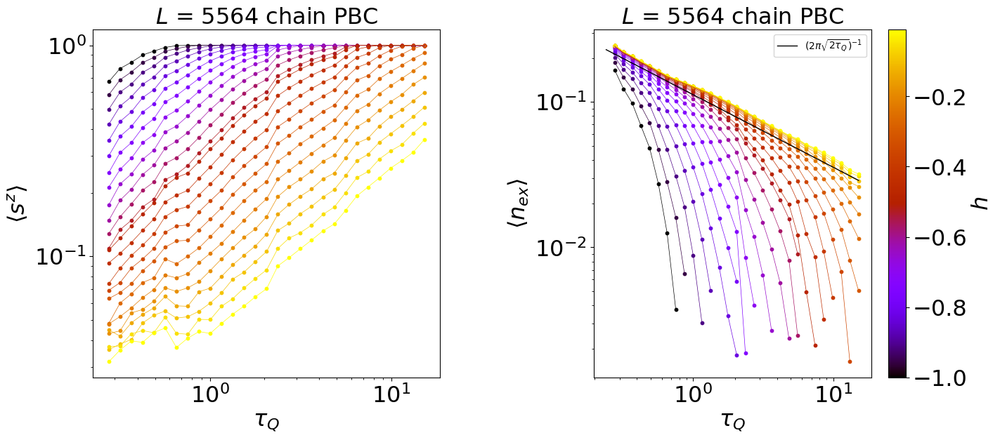

In [21]:
# PLOT RESULTS

third_axis = hcojcsu
third_axis_name = '$h$'
tqs = tqsu[:34]

cmap = plt.get_cmap('gnuplot')
colors = [cmap(i) for i in np.linspace(.0, 1., len(third_axis))]

lw = .5
s = 10
    
fig, ax = plt.subplots(1,2,figsize=(15,8))

ax[0].set_xlabel(r"$\tau_Q$", fontsize = 23)
ax[0].tick_params(axis='x',labelsize=23)
ax[0].tick_params(axis='y',labelsize=23)
ax[0].set_ylabel(r"$\langle s^z\rangle$", fontsize=23)
ax[0].set_title('$L$ = '+str(L)+' chain PBC', fontsize = 23)

ax[1].set_xlabel(r"$\tau_Q$", fontsize = 23)
ax[1].tick_params(axis='x',labelsize=23)
ax[1].tick_params(axis='y',labelsize=23)
ax[1].set_ylabel(r"$\langle n_{ex}\rangle$", fontsize=23)
ax[1].set_title('$L$ = '+str(L)+' chain PBC', fontsize = 23)

for taxind, tax in enumerate(third_axis):

    mask = [znenex[taxind,:] > 1.5*10**-3]
    ax[0].scatter(tqs,znemag[taxind,:], color=colors[taxind], s=s)
    ax[0].plot(tqs,znemag[taxind,:], color=colors[taxind], lw=lw)
    ax[1].scatter(tqs[mask[0]],znenex[taxind,mask[0]], color=colors[taxind], s=s)
    ax[1].plot(tqs[mask[0]],znenex[taxind,mask[0]], color=colors[taxind], lw=lw)

x = np.geomspace(tqs[4],tqs[-1],100)
y = 1/(2*np.pi*np.sqrt(2*x))
ax[1].plot(x, y, color='black', lw=2*lw, label=r'$(2\pi\sqrt{2\tau_Q})^{-1}$')
ax[1].legend()

fig.tight_layout(pad=7)
normalize = mcolors.Normalize(vmin=min(third_axis), vmax=max(third_axis))
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=cmap)
scalarmappaple.set_array(third_axis)
cbar = plt.colorbar(scalarmappaple, ax=ax[1])
cbar.set_label(label=third_axis_name, size='23')
cbar.ax.tick_params(labelsize='23')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[1].set_xscale('log')
ax[1].set_yscale('log')

In [22]:
fig.savefig('Figs/1D_ZNE_UNcollapsed_plots.pdf')

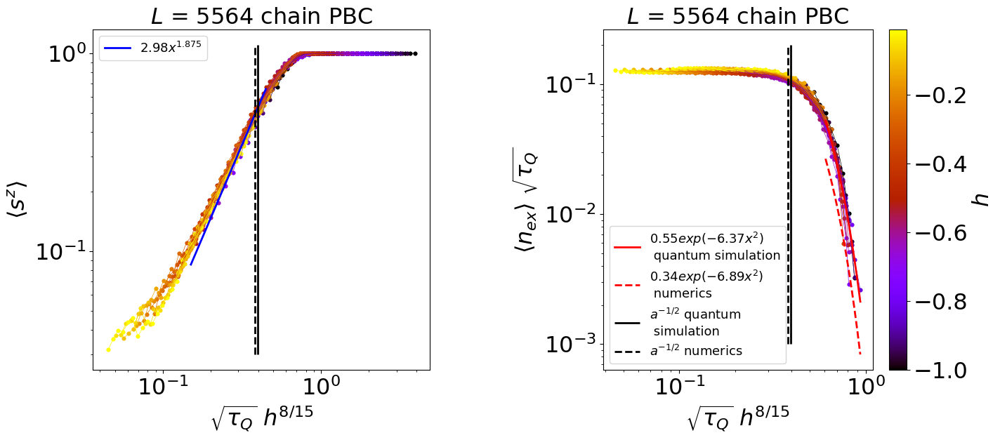

In [23]:
# PLOT RESULTS

third_axis = hcojcsu
third_axis_name = '$h$'
tqs = tqsu[:34]

cmap = plt.get_cmap('gnuplot')
colors = [cmap(i) for i in np.linspace(.0, 1., len(third_axis))]

lw = .5
s = 10
    
fig, ax = plt.subplots(1,2,figsize=(15,8))

ax[0].set_xlabel(r"$\sqrt{\tau_Q}$ $h^{8/15}$", fontsize = 23)
ax[0].tick_params(axis='x',labelsize=23)
ax[0].tick_params(axis='y',labelsize=23)
ax[0].set_ylabel(r"$\langle s^z\rangle$", fontsize=23)
ax[0].set_title('$L$ = '+str(L)+' chain PBC', fontsize = 23)

ax[1].set_xlabel(r"$\sqrt{\tau_Q}$ $h^{8/15}$", fontsize = 23)
ax[1].tick_params(axis='x',labelsize=23)
ax[1].tick_params(axis='y',labelsize=23)
ax[1].set_ylabel(r"$\langle n_{ex}\rangle$ $\sqrt{\tau_Q}$", fontsize=23)
ax[1].set_title('$L$ = '+str(L)+' chain PBC', fontsize = 23)

xszstart, xszend, xnexstart, xnexend = .15, .45, .6, 1.
xnex, ynex, xsz, ysz = np.array([]), np.array([]), np.array([]), np.array([])

for taxind, tax in enumerate(third_axis):

    mask = [znenex[taxind,:] > 1.5*10**-3]
    xtemp = np.sqrt(tqs)*abs(tax)**(8/15)
    ysztemp = znemag[taxind,:]
    ynextemp = np.sqrt(tqs)*znenex[taxind,:]
    
    ax[0].scatter(xtemp, ysztemp, color=colors[taxind], s=s)
    ax[0].plot(xtemp, ysztemp, color=colors[taxind], lw=lw)
    ax[1].scatter(xtemp[mask[0]], ynextemp[mask[0]], color=colors[taxind], s=s)
    ax[1].plot(xtemp[mask[0]], ynextemp[mask[0]], color=colors[taxind], lw=lw)

    ysztemp = np.array(ysztemp)
    ynextemp = np.array(ynextemp)
    for indtemp, temp in enumerate(ynextemp):
        if xnexstart <= xtemp[indtemp] <= xnexend and temp > 0:
            xnex = np.concatenate((xnex,np.array([xtemp[indtemp]])))
            ynex = np.concatenate((ynex,np.array([temp])))
    for indtemp, temp in enumerate(xtemp):
        if len(ysztemp) > 0:
            if xszstart <= temp <= xszend and ysztemp[indtemp] > 0:
                xsz = np.concatenate((xsz,np.array([xtemp[indtemp]])))
                ysz = np.concatenate((ysz,np.array([ysztemp[indtemp]])))

    ax[0].scatter(xtemp, ysztemp, color=colors[taxind], s=s)
    ax[1].scatter(xtemp[mask[0]], ynextemp[mask[0]], color=colors[taxind], s=s)

def fit_func(x, amplitude):
    return amplitude*x**1.875

params = curve_fit(fit_func, xsz, ysz)

[amplitude] = params[0]

xsz = np.sort(xsz)

ax[0].plot(xsz, [fit_func(xi, amplitude) for xi in xsz], color='blue', ls='-', lw=4*lw, 
            label='$'+str(amplitude.round(2))+'x^{1.875}$')

def fit_func(x, A, a):
    return A*np.exp(-a*x**2)

params = curve_fit(fit_func, xnex, ynex)

[A, a] = params[0]

xnex = np.sort(xnex)
ax[1].plot(xnex, [fit_func(xi, A, a) for xi in xnex], color='red', lw=4*lw, 
              label='$'+str(A.round(2))+'exp(-'+str(a.round(2))+'x^2)$\n quantum simulation')
ax[1].plot(xnex, [fit_func(xi, .34, 6.89) for xi in xnex], color='red',ls='--', lw=4*lw, 
              label='$'+str(.34)+'exp(-'+str(6.89)+'x^2)$\n numerics')

ax[0].vlines(1/np.sqrt(a),.03,1.1,lw=4*lw,color='black')
ax[0].vlines(1/np.sqrt(6.89),.03,1.1,lw=4*lw,ls='--',color='black')
ax[1].vlines(1/np.sqrt(a),.001,.2,lw=4*lw,color='black',label='$a^{-1/2}$ quantum\n simulation')
ax[1].vlines(1/np.sqrt(6.89),.001,.2,lw=4*lw,ls='--',color='black',label='$a^{-1/2}$ numerics')
#ax[1].hlines(1/(2*np.pi*np.sqrt(2)),.07,.7,lw=4*lw,ls='--',color='black')
#ax[1].set_xlim(.055,1.1)

fig.tight_layout(pad=7)
normalize = mcolors.Normalize(vmin=min(third_axis), vmax=max(third_axis))
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=cmap)
scalarmappaple.set_array(third_axis)
cbar = plt.colorbar(scalarmappaple, ax=ax[1])
cbar.set_label(label=third_axis_name, size='23')
cbar.ax.tick_params(labelsize='23')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[0].legend(fontsize=13)
ax[1].legend(fontsize=13)

In [24]:
fig.savefig('Figs/1D_ZNE_collapsed_plots_with_numerics_comparison_fixed_fit.pdf')

In [27]:
L = 5564
J = -1.

hz_range = -np.linspace(.0,1.,11).round(6)
ta_range = np.linspace(.005,.02,16).round(6)
en_range = np.linspace(.01,2.,20).round(6)

profil = 'jvodebjuelich'
num_reads = 1000
embedding_string_short = '54chainPBC'
auto_scale = False
answer_mode="raw"
fast_anneal=True

ds = range(0,1)

df = pd.read_csv('Data/09-1265A-E_Advantage_system5_4_annealing_schedule.csv', sep=',', decimal='.')
sa = np.array([round(df['s'][i],3) for i in range(1000)])
Ga = np.array([round(df['A(s) (GHz)'][i],3)*np.pi for i in range(1000)])
Ja = np.array([round(df['B(s) (GHz)'][i],3)*np.pi for i in range(1000)])

def sc(E,gc=1.):
    return sa[np.argmin(abs(Ga-gc*E*Ja))]
def Jc(E,gc=1.):
    return E * Ja[np.argmin(abs(Ga-gc*E*Ja))]
def Gc(E,gc=1.):
    return Ga[np.argmin(abs(Ga-gc*E*Ja))]
def Jcp(E,gc=1.):
    return np.gradient(E*Ja,sa)[np.argmin(abs(Ga-gc*E*Ja))]
def Gcp(E,gc=1.):
    return np.gradient(Ga,sa)[np.argmin(abs(Ga-gc*E*Ja))]
def tQ(ta,E,gc=1.):
    # ta must be in ns
    return ta / gc * Jc(E,gc) / (Jcp(E,gc)/Jc(E,gc) - Gcp(E,gc)/Gc(E,gc))
def tQ_to_ta(tq,E,gc=1.):
    # ta must be in ns
    return tq * gc / Jc(E,gc) * (Jcp(E,gc)/Jc(E,gc) - Gcp(E,gc)/Gc(E,gc))
def hcoJc(h,E,gc=1.):
    return h
def hcoJc_to_hz(hcoJc,E,gc=1.):
    return hcoJc
def en_to_lambda(E,gc=1.):
    return ((Jcp(E,gc)/Jc(E,gc) - Gcp(E,gc)/Gc(E,gc)) / Jc(E,gc)) / ((Jcp(1.,gc)/Jc(1.,gc) - Gcp(1.,gc)/Gc(1.,gc)) / Jc(1.,gc))

en_range = np.linspace(.1,2.,20).round(6)
            
ens, ens1, tqs, tas, hcojs, hzs = [], [], [], [], [], []
for en in en_range:
    for tq in np.geomspace(tQ(5,.1),tQ(100,2.),40):
        if tQ(5,en) < tq < tQ(100,en):
            for hz in np.geomspace(hcoJc(-1.,.1,gc=1.), hcoJc(-.01,.1,gc=1.), 12):
                if hcoJc(-1.,en) <= hz <= hcoJc(-0.,en):
                    hcojs.append(hz.round(6))
                    hzs.append(hcoJc_to_hz(hz,en).round(6))
                    ens.append(en.round(6))
                    tqs.append(tq.round(6))
                    tas.append((tQ_to_ta(tq,en)/1000.).round(6))

hzenta_range = [[ens[i],tas[i],hzs[i]] for i in range(len(ens))]

# READ ANALYZED RESULTS

with gzip.open('Data/1D_tfim_1st_sweep_mag_1.txt.gz', "r") as f:
    fvd_mags = eval(f.read())
with gzip.open('Data/1D_tfim_1st_sweep_corr_1.txt.gz', "r") as f:
    fvd_corrs = eval(f.read())
with gzip.open('Data/1D_tfim_1st_sweep_counts.txt.gz', "r") as f:
    fvd_counts = eval(f.read())

# PLOTTING CONVERSION

tqsu = np.unique(tqs)
hcojcsu = np.unique(hcojs)
datamag = {}
datanex = {}
datacnt = {}
keys = []
for tq in tqsu:
    for hcojc in hcojcsu:
        datamag[(tq,hcojc)] = []
        datanex[(tq,hcojc)] = []
        datacnt[(tq,hcojc)] = []
        keys.append((tq,hcojc))

start = time.time()
for hzentaind, [en,ta,hz] in enumerate(hzenta_range):
    if (hzentaind < 1000 and hzentaind%100 == 1) or (hzentaind%1000 == 1):
        print(f'Converting i={hzentaind} / {len(hzenta_range)} (elapsed time so far: {time.time()-start:.2f} s, {(time.time()-start)/hzentaind:.2f} s per data set)')
    try:
        tq = tqsu[np.abs(tQ(1000*ta,en).round(6) - tqsu).argmin()]
        hcojc = hcojcsu[np.abs(hcoJc(hz,en) - hcojcsu).argmin()]
        datamag[(tq,hcojc)].append([en_to_lambda(en),fvd_mags[(L,J,hz,ta,en,num_reads,'szmean')]])
        datanex[(tq,hcojc)].append([en_to_lambda(en),fvd_mags[(L,J,hz,ta,en,num_reads,'nexmean')]])
        datacnt[(tq,hcojc)].append([en_to_lambda(en),fvd_counts[(L,J,hz,ta,en,num_reads,'domain lengths')]])
    except:
        continue

for key in keys:
    if datamag[key] == []:
        del datamag[key]
        del datanex[key]
        del datacnt[key]
        print(key)

# PLOTTING CONVERSION

mag = {}
nex = {}
corr = {}
cnt = {}

for hzentaind, [en,ta,hz] in enumerate(hzenta_range):
    try:
        mag[(hz,ta,en)] = fvd_mags[(L,J,hz,ta,en,num_reads,'szmean')]
        nex[(hz,ta,en)] = fvd_mags[(L,J,hz,ta,en,num_reads,'nexmean')]
        cnt[(hz,ta,en)] = fvd_counts[(L,J,hz,ta,en,num_reads,'domain lengths')]
        for d in ds:
            corr[(hz,ta,en,d)] = fvd_corrs[(L,J,hz,ta,en,num_reads,d,'szsz'+str(d)+'mean')]
    except:
        continue

Converting i=1 / 5004 (elapsed time so far: 0.00 s, 0.00 s per data set)
Converting i=101 / 5004 (elapsed time so far: 0.06 s, 0.00 s per data set)
Converting i=201 / 5004 (elapsed time so far: 0.12 s, 0.00 s per data set)
Converting i=301 / 5004 (elapsed time so far: 0.18 s, 0.00 s per data set)
Converting i=401 / 5004 (elapsed time so far: 0.28 s, 0.00 s per data set)
Converting i=501 / 5004 (elapsed time so far: 0.37 s, 0.00 s per data set)
Converting i=601 / 5004 (elapsed time so far: 0.44 s, 0.00 s per data set)
Converting i=701 / 5004 (elapsed time so far: 0.50 s, 0.00 s per data set)
Converting i=801 / 5004 (elapsed time so far: 0.59 s, 0.00 s per data set)
Converting i=901 / 5004 (elapsed time so far: 0.66 s, 0.00 s per data set)
Converting i=1001 / 5004 (elapsed time so far: 0.71 s, 0.00 s per data set)
Converting i=2001 / 5004 (elapsed time so far: 1.46 s, 0.00 s per data set)
Converting i=3001 / 5004 (elapsed time so far: 2.16 s, 0.00 s per data set)
Converting i=4001 / 5004

C:\Users\jakav\AppData\Local\Temp\ipykernel_17552\3759540564.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,7))


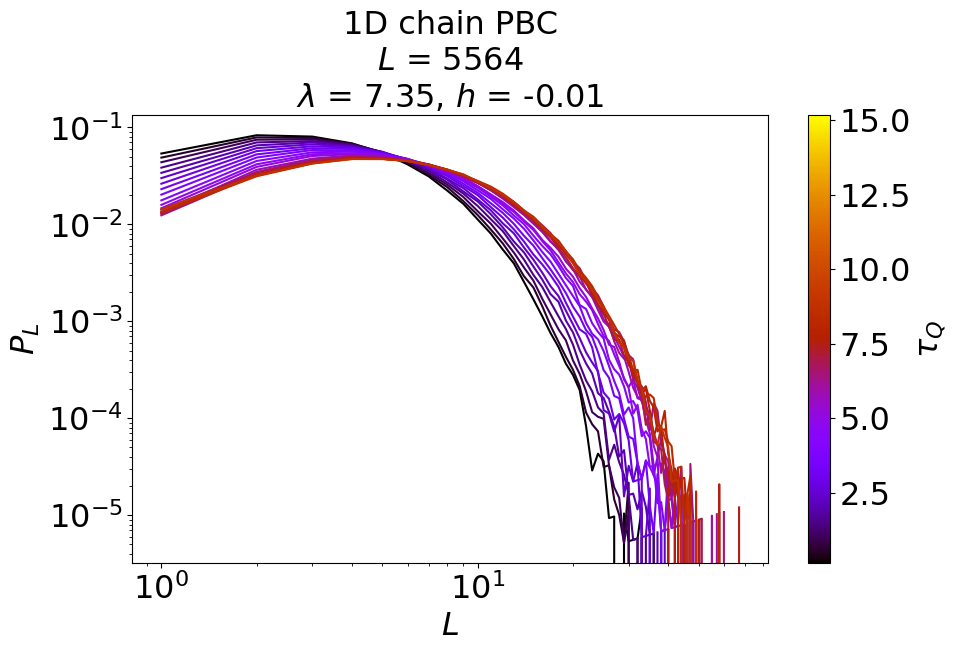

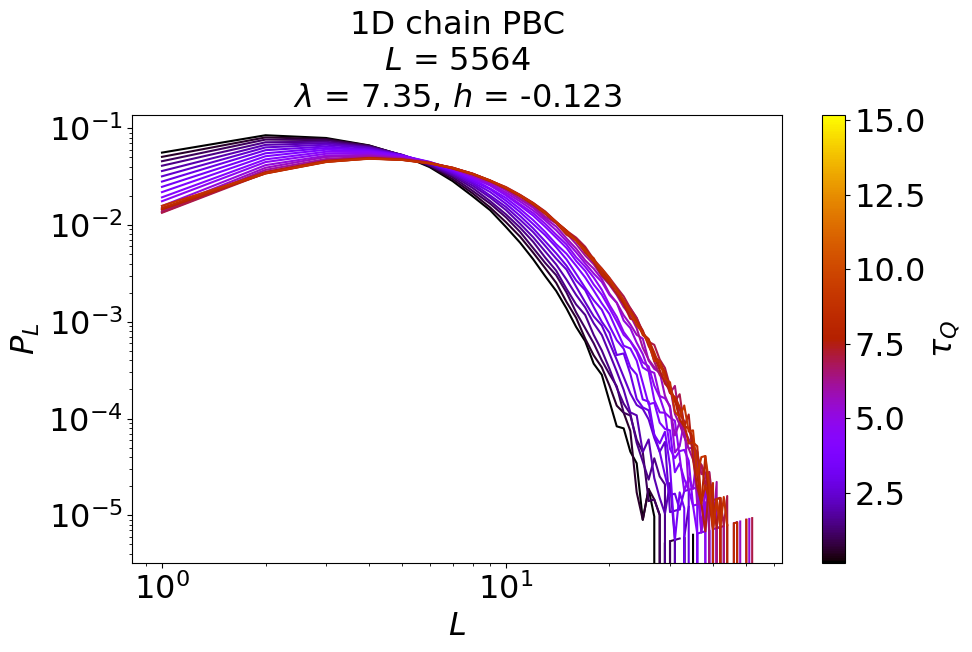

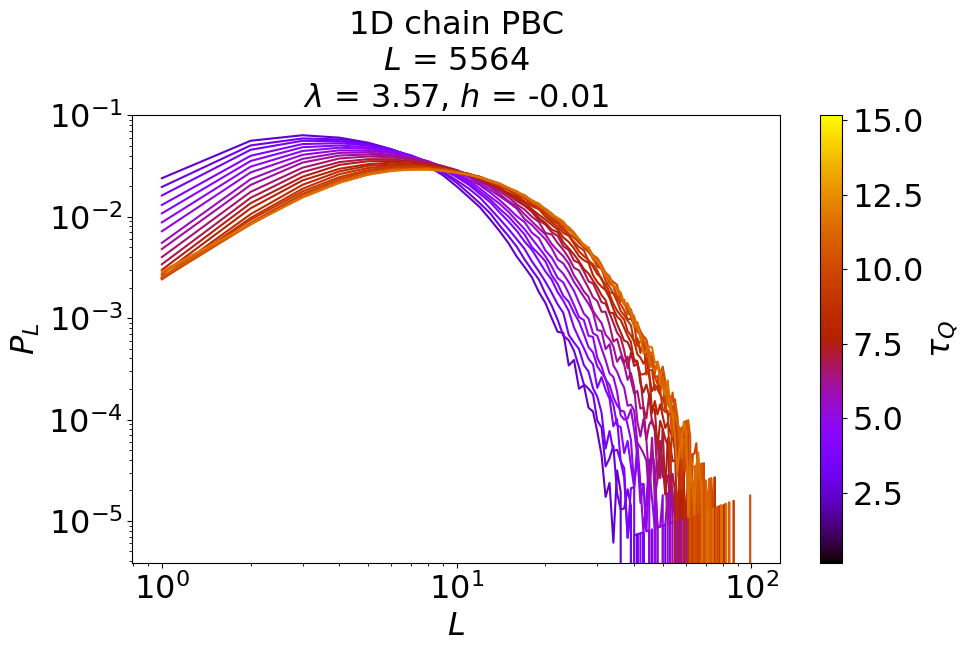

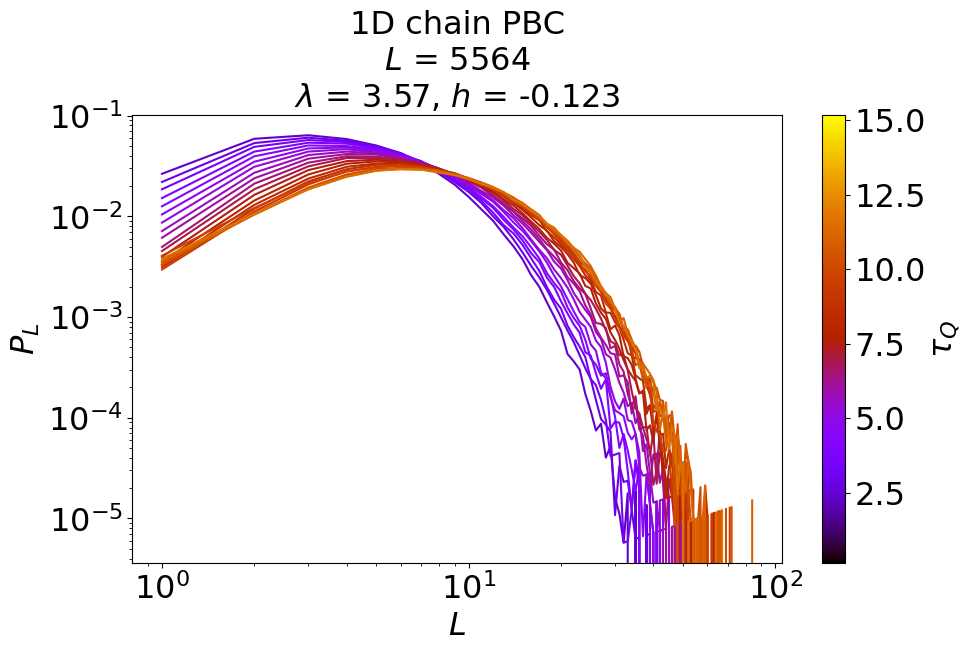

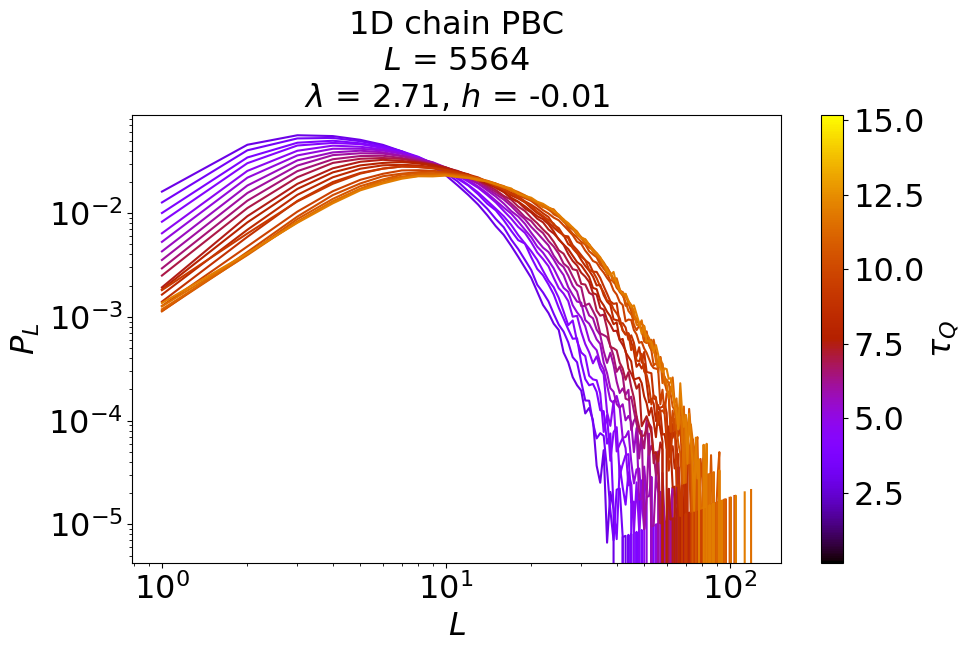

...

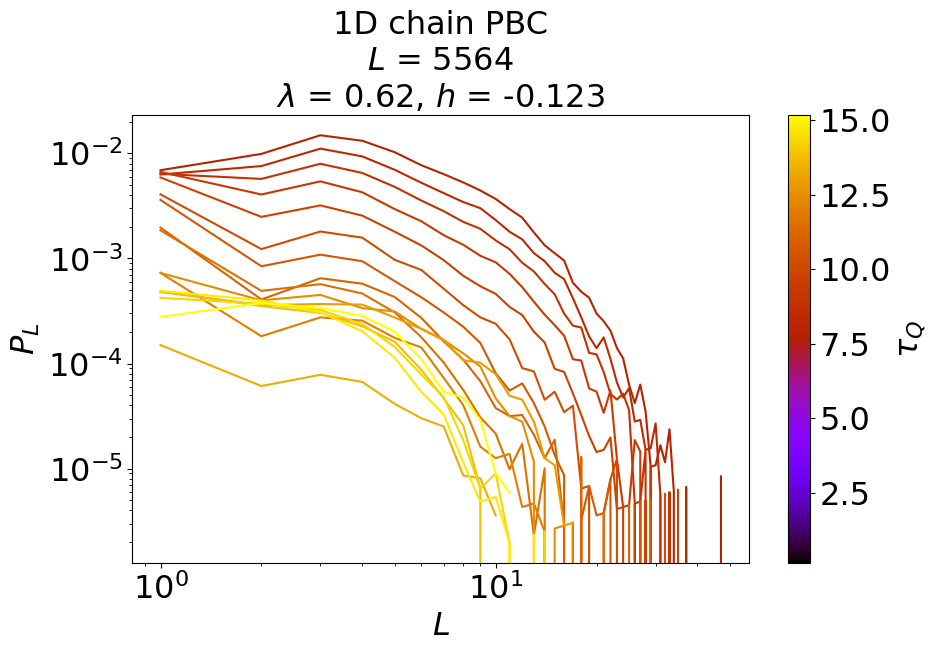

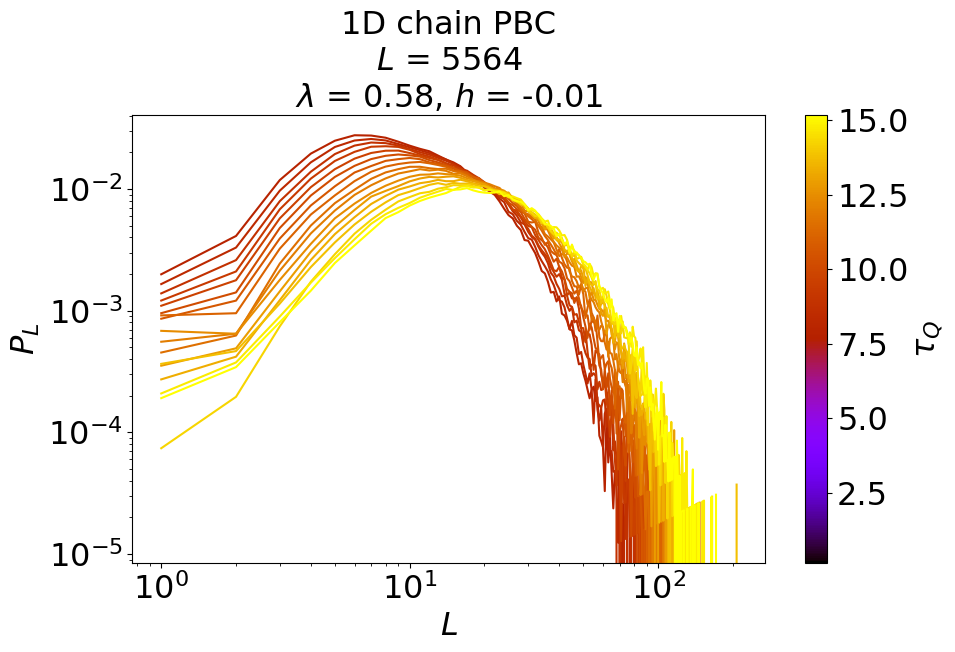

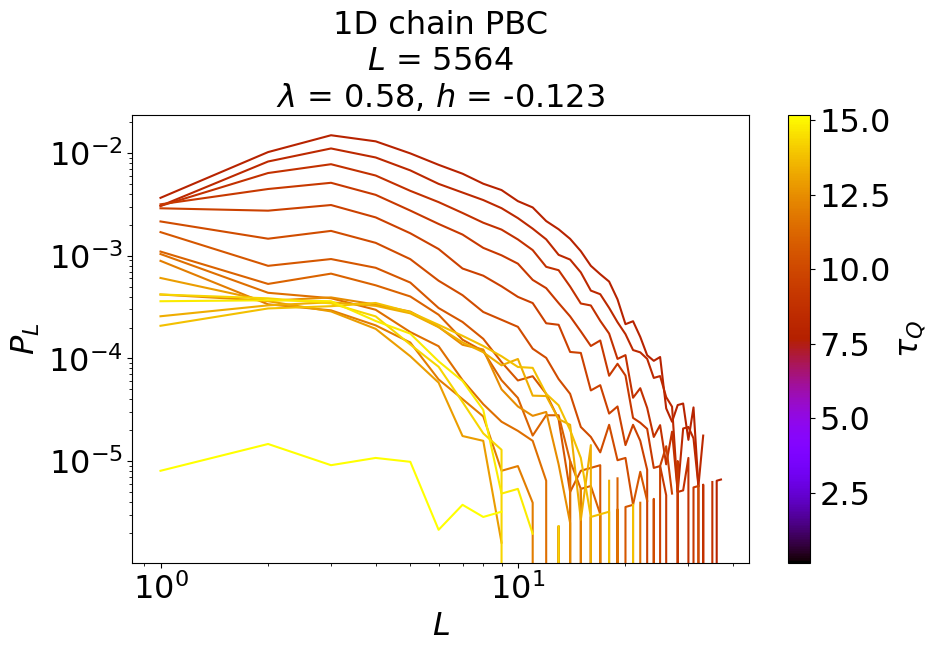

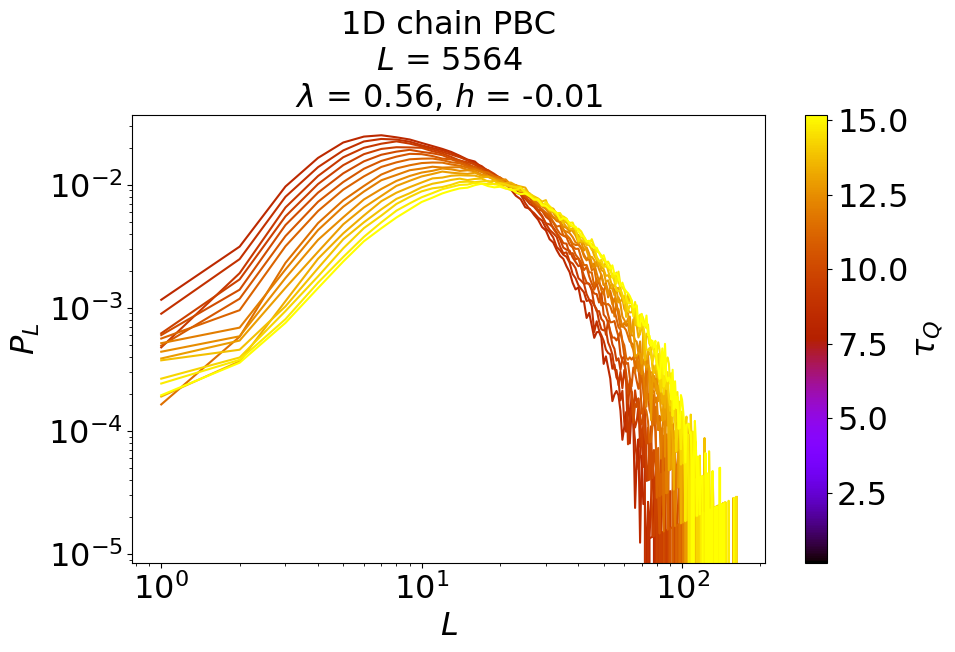

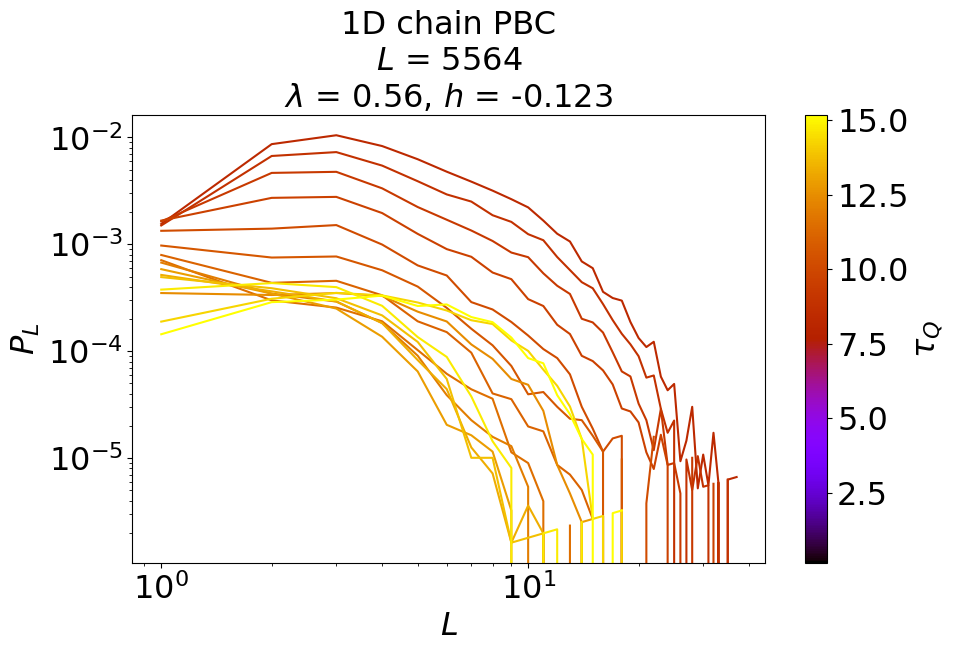

In [28]:
# PLOT RESULTS

lambdas = np.array([en_to_lambda(e) for e in en_range])
third_axis = tqsu[:34]
third_axis_name = r'$\tau_Q$'

cmap = plt.get_cmap('gnuplot')
colors = [cmap(i) for i in np.linspace(.0, 1., len(third_axis))]

bins = range(500)

for lamind, lam in enumerate(lambdas):
    for hcojc in np.array([-.01,-.123285]):
        
        fig, ax = plt.subplots(figsize=(10,7))
        
        ax.set_xlabel(r"$L$", fontsize = 23)
        ax.tick_params(axis='x',labelsize=23)
        ax.tick_params(axis='y',labelsize=23)
        ax.set_ylabel(r"$P_L$", fontsize=23)
        ax.set_title('1D chain PBC\n$L$ = '+str(L)+'\n'+r'$\lambda$ = '+str(lam.round(2))+r', $h$ = '+str(hcojc.round(3)), fontsize = 23)
        
        for taxind, tax in enumerate(third_axis):

            try:
                index = np.where(np.array([datacnt[(tax,hcojc)][i][0] for i in range(len(datacnt[(tax,hcojc)]))]) == lam)[0]
                if len(index) > 0:
                    countstemp = datacnt[(tax,hcojc)][index[0]][1]
                    
                    xtemp = np.array(list(countstemp.keys()))
                    ytemp = np.array([countstemp[key] * key / (L*num_reads) for key in xtemp])
                    
                    ax.plot(xtemp, ytemp, color=colors[taxind])
            except:
                continue
    
        fig.tight_layout(pad=2.5)
        normalize = mcolors.Normalize(vmin=min(third_axis), vmax=max(third_axis))
        scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=cmap)
        scalarmappaple.set_array(third_axis)
        cbar = plt.colorbar(scalarmappaple, ax=ax)
        cbar.set_label(label=third_axis_name, size='23')
        cbar.ax.tick_params(labelsize='23')
        ax.set_xscale('log')
        ax.set_yscale('log')

        fig.savefig('Figs/1D_PL_vs_L_lambda_'+str(lam)+'_h_'+str(hcojc)+'.pdf')

C:\Users\jakav\AppData\Local\Temp\ipykernel_17552\581838544.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,7))


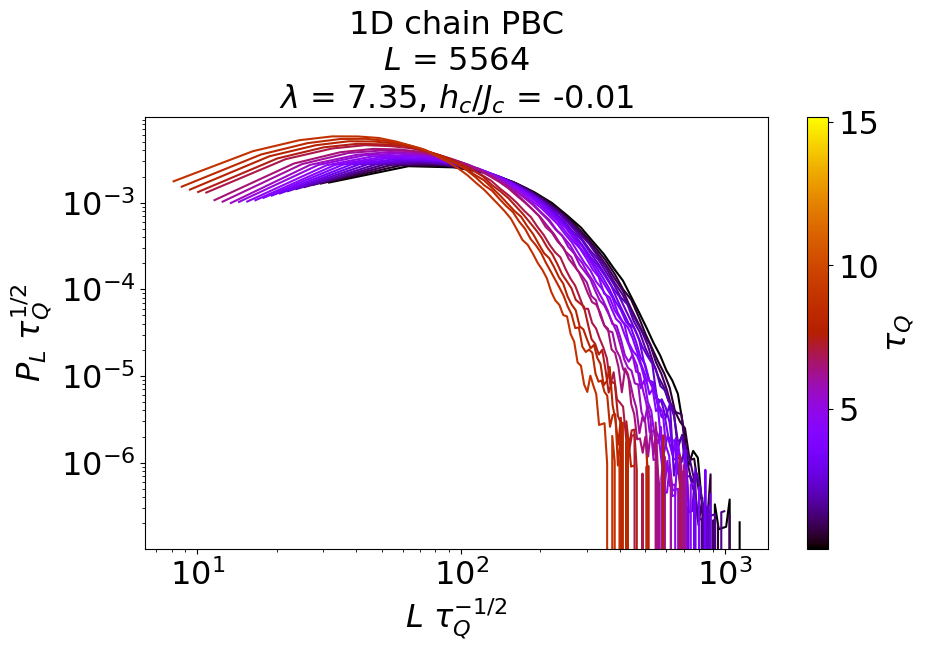

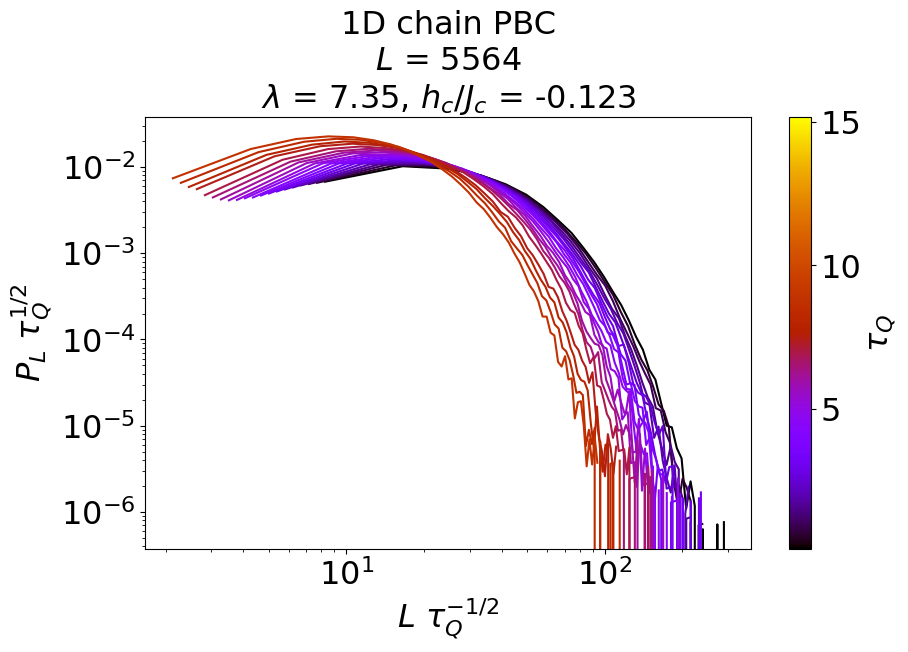

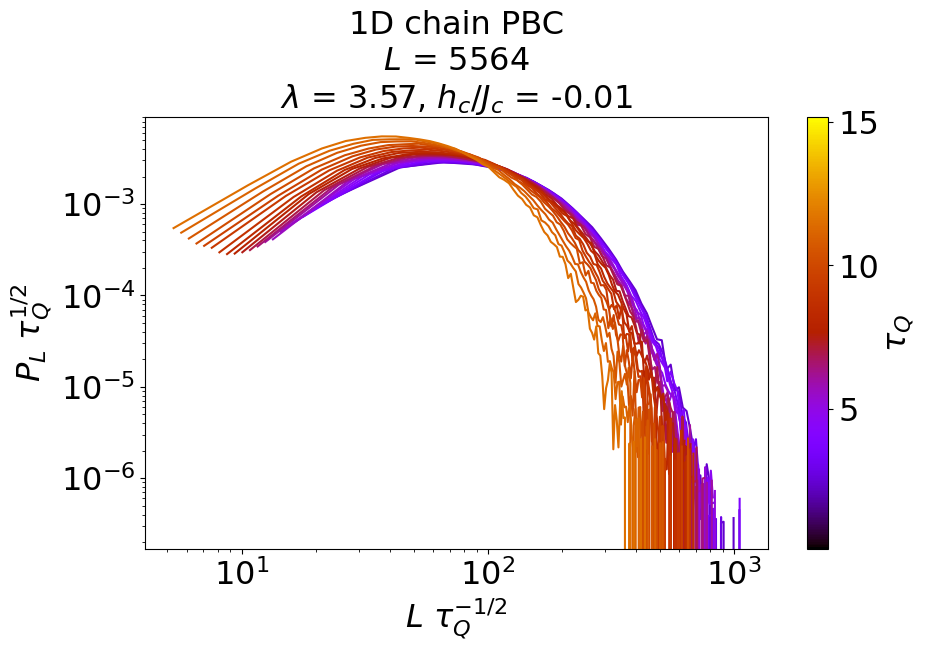

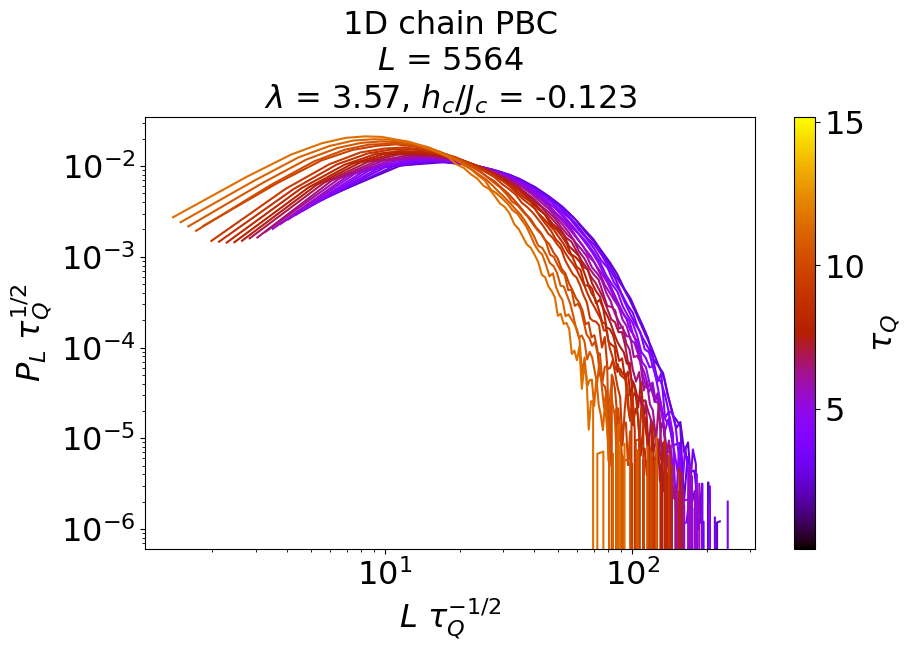

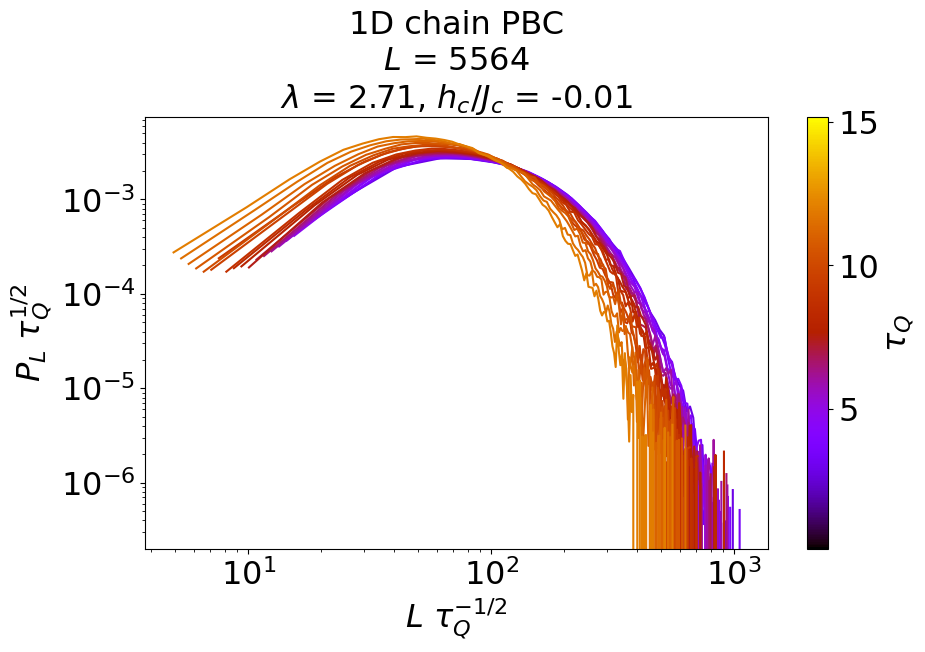

...

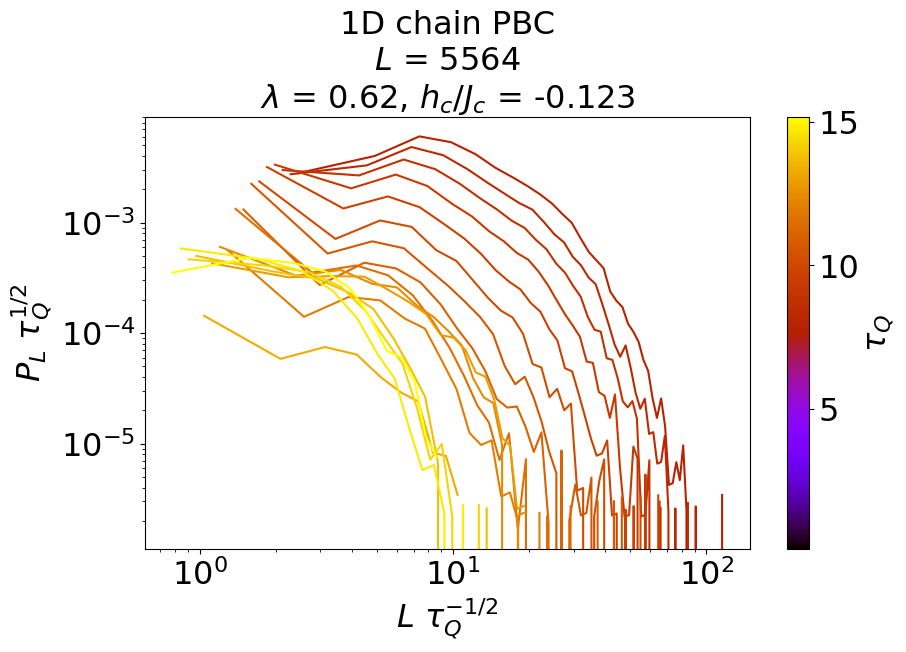

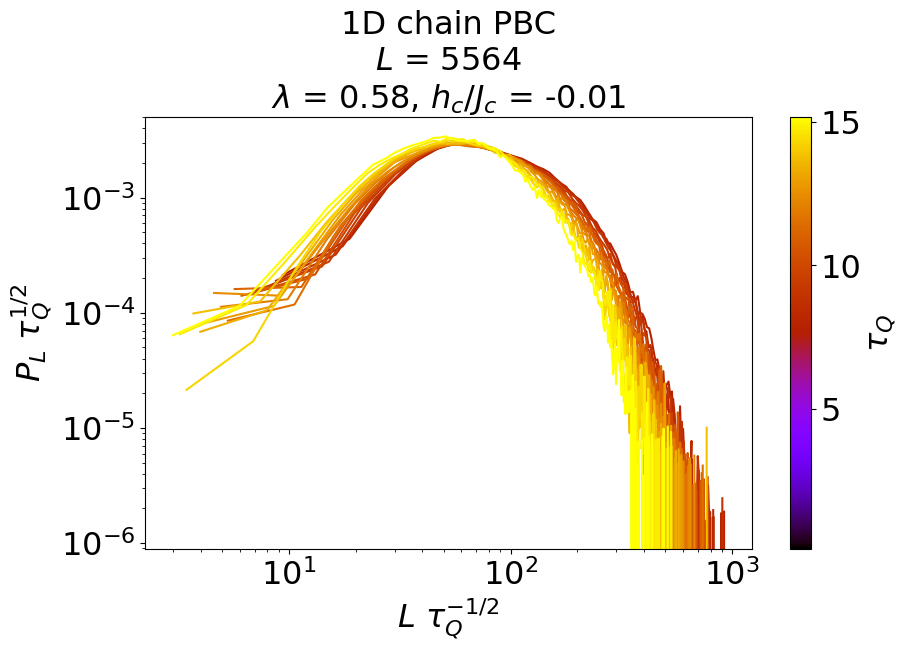

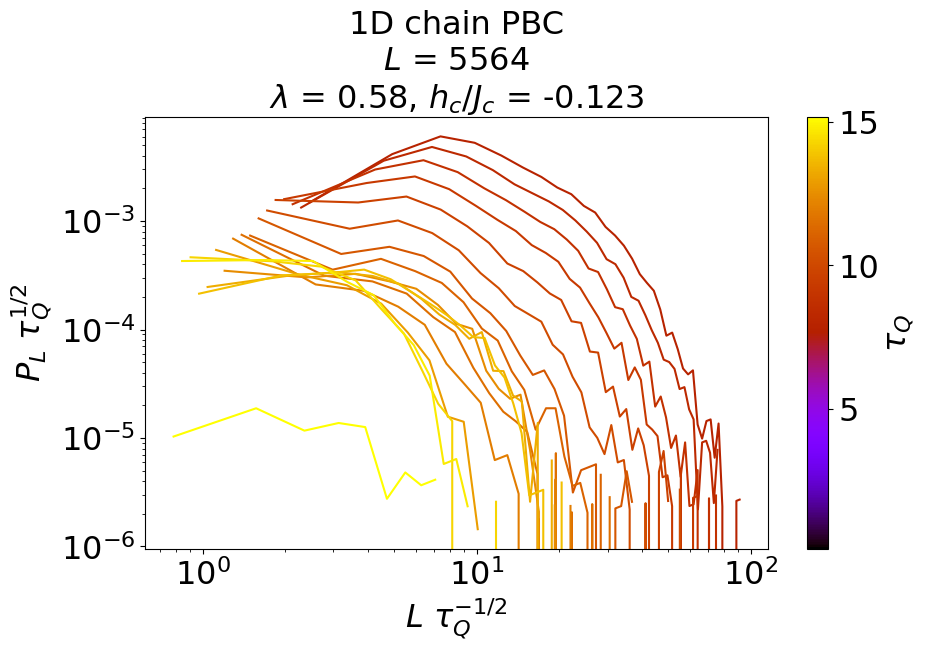

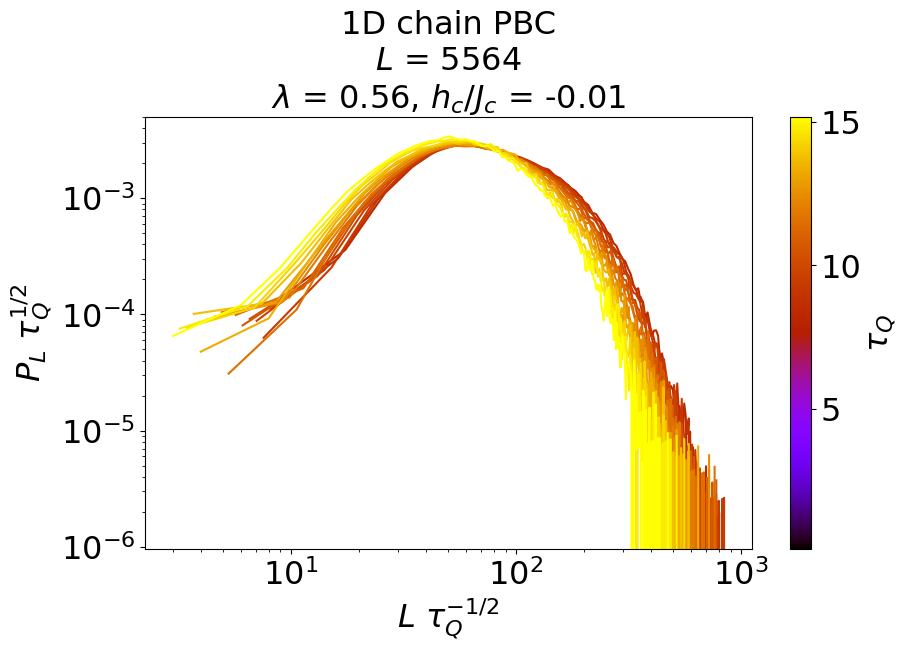

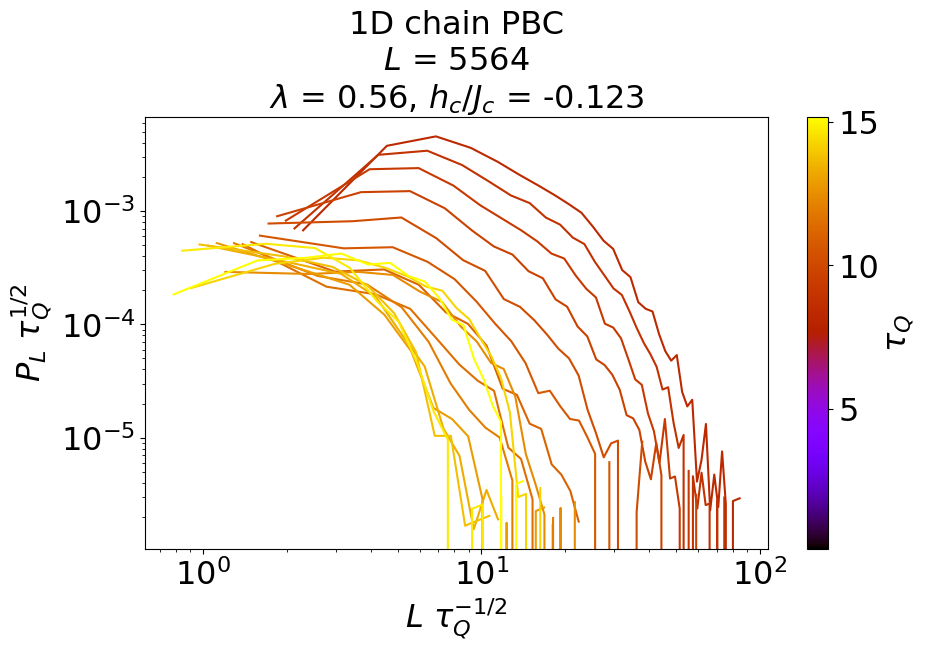

In [29]:
# PLOT RESULTS

lambdas = np.array([en_to_lambda(e) for e in en_range])
third_axis = tqsu[:34]
third_axis_name = r'$\tau_Q$'

cmap = plt.get_cmap('gnuplot')
colors = [cmap(i) for i in np.linspace(.0, 1., len(third_axis))]

bins = range(500)

for lamind, lam in enumerate(lambdas):
    for hcojc in np.array([-.01,-.123285]):
        
        fig, ax = plt.subplots(figsize=(10,7))
        
        ax.set_xlabel(r"$L$ $\tau_Q^{-1/2}$", fontsize = 23)
        ax.tick_params(axis='x',labelsize=23)
        ax.tick_params(axis='y',labelsize=23)
        ax.set_ylabel(r"$P_L$ $\tau_Q^{1/2}$", fontsize=23)
        ax.set_title('1D chain PBC\n$L$ = '+str(L)+'\n'+r'$\lambda$ = '+str(lam.round(2))+r', $h_c/J_c$ = '+str(hcojc.round(3)), fontsize = 23)
        
        for taxind, tax in enumerate(third_axis):

            try:
                index = np.where(np.array([datacnt[(tax,hcojc)][i][0] for i in range(len(datacnt[(tax,hcojc)]))]) == lam)[0]
                if len(index) > 0:
                    countstemp = datacnt[(tax,hcojc)][index[0]][1]
                    
                    xtemp = np.array(list(countstemp.keys()))
                    ytemp = np.array([countstemp[key] * key / (L*num_reads) for key in xtemp])
                    xtemp = xtemp * tax**-.5 * abs(hcojc)**(-8/15)
                    ytemp = ytemp * tax**.5 * abs(hcojc)**(8/15)
                    
                    ax.plot(xtemp, ytemp, color=colors[taxind])
            except:
                continue
    
        fig.tight_layout(pad=2.5)
        normalize = mcolors.Normalize(vmin=min(third_axis), vmax=max(third_axis))
        scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=cmap)
        scalarmappaple.set_array(third_axis)
        cbar = plt.colorbar(scalarmappaple, ax=ax)
        cbar.set_label(label=third_axis_name, size='23')
        cbar.ax.tick_params(labelsize='23')
        ax.set_xscale('log')
        ax.set_yscale('log')

        fig.savefig('Figs/1D_PL_vs_L_collapsed_lambda_'+str(lam)+'_h_'+str(hcojc)+'.pdf')

In [30]:
L = 5557
J = -1.

hz_range = -np.geomspace(.01,.3,11).round(6)
ta_range = np.geomspace(.005,.05,40).round(6)
en_range = np.linspace(.1,2.,20).round(6)
samples = np.linspace(1.,2.,2).round(6)

profil = 'jvodebjuelich'
num_reads = 5000
embedding_string_short = '64chainPBC'
auto_scale = False
answer_mode="raw"
fast_anneal=True

ds = range(1,2)

df = pd.read_csv('Data/09-1273A-E_Advantage_system6_4_annealing_schedule.csv', sep=',', decimal='.')
sa = np.array([round(df['s'][i],3) for i in range(1000)])
Ga = np.array([round(df['A(s) (GHz)'][i],3)*np.pi for i in range(1000)])
Ja = np.array([round(df['B(s) (GHz)'][i],3)*np.pi for i in range(1000)])

def sc(E,gc=1.):
    return sa[np.argmin(abs(Ga-gc*E*Ja))]
def Jc(E,gc=1.):
    return E * Ja[np.argmin(abs(Ga-gc*E*Ja))]
def Gc(E,gc=1.):
    return Ga[np.argmin(abs(Ga-gc*E*Ja))]
def Jcp(E,gc=1.):
    return np.gradient(E*Ja,sa)[np.argmin(abs(Ga-gc*E*Ja))]
def Gcp(E,gc=1.):
    return np.gradient(Ga,sa)[np.argmin(abs(Ga-gc*E*Ja))]
def tQ(ta,E,gc=1.):
    # ta must be in ns
    return ta / gc * Jc(E,gc) / (Jcp(E,gc)/Jc(E,gc) - Gcp(E,gc)/Gc(E,gc))
def tQ_to_ta(tq,E,gc=1.):
    # ta must be in ns
    return tq * gc / Jc(E,gc) * (Jcp(E,gc)/Jc(E,gc) - Gcp(E,gc)/Gc(E,gc))
def hcoJc(h,E,gc=1.):
    return h
def hcoJc_to_hz(hcoJc,E,gc=1.):
    return hcoJc
def en_to_lambda(E,gc=1.):
    return ((Jcp(E,gc)/Jc(E,gc) - Gcp(E,gc)/Gc(E,gc)) / Jc(E,gc)) / ((Jcp(1.,gc)/Jc(1.,gc) - Gcp(1.,gc)/Gc(1.,gc)) / Jc(1.,gc))

en_range = np.linspace(.1,2.,20).round(6)

ens, ens1, tqs, tas, hcojs, hzs = [], [], [], [], [], []
for en in en_range:
    for ta in ta_range:
        if tQ(5,en) <= tQ(1000*ta,en) <= tQ(1000,en):
            for hz in hz_range:
                if hcoJc(-1.,en) <= hz <= hcoJc(0.,en):
                    hcojs.append(hz.round(6))
                    hzs.append(hz.round(6))
                    ens.append(en.round(6))
                    tqs.append(tQ(1000*ta,en).round(6))
                    tas.append((ta).round(6))

hzenta_range = [[ens[i],tas[i],hzs[i],s] for i in range(len(ens)) for s in samples]



with gzip.open('Data/1D_tfim_10th_sweep_mag.txt.gz', "r") as f:
    fvd_mags = eval(f.read())
with gzip.open('Data/1D_tfim_10th_sweep_corr.txt.gz', "r") as f:
    fvd_corrs = eval(f.read())
with gzip.open('Data/1D_tfim_10th_sweep_counts.txt.gz', "r") as f:
    fvd_counts = eval(f.read())

# PLOTTING CONVERSION

def average_dict_list(dicts):
    result = {}
    # union of all keys
    all_keys = set().union(*(d.keys() for d in dicts))

    for k in all_keys:
        vals = [d[k] for d in dicts if k in d]
        result[k] = sum(vals) / len(vals)
    return result

def average_domain_length(d):
    total_domains = sum(d.values())
    if total_domains == 0:
        return 0.0
    return sum(k * v for k, v in d.items()) / total_domains

tqsu = np.unique(tqs)
hcojcsu = np.unique(hcojs)
datamag = {}
datanex = {}
datacnt = {}
datalen = {}
keys = []
for tq in tqsu:
    for hcojc in hcojcsu:
        datamag[(tq,hcojc)] = []
        datanex[(tq,hcojc)] = []
        datacnt[(tq,hcojc)] = []
        datalen[(tq,hcojc)] = []
        keys.append((tq,hcojc))

hzenta_range = [[ens[i],tas[i],hzs[i]] for i in range(len(ens))]

start = time.time()
for hzentaind, [en,ta,hz] in enumerate(hzenta_range):
    if (hzentaind < 1000 and hzentaind%100 == 1) or (hzentaind%1000 == 1):
        print(f'Converting i={hzentaind} / {len(hzenta_range)} (elapsed time so far: {time.time()-start:.2f} s, {(time.time()-start)/hzentaind:.2f} s per data set)')
    try:
        tq = tqsu[np.abs(tQ(1000*ta,en).round(6) - tqsu).argmin()]
        hcojc = hcojcsu[np.abs(hcoJc(hz,en) - hcojcsu).argmin()]
        datamag[(tq,hcojc)].append([en_to_lambda(en),np.mean(np.array([fvd_mags[(L,s,J,hz,ta,en,num_reads,'szmean')] for s in samples]))])
        datanex[(tq,hcojc)].append([en_to_lambda(en),np.mean(np.array([fvd_mags[(L,s,J,hz,ta,en,num_reads,'nexmean')] for s in samples]))])
        avg_dict = average_dict_list(np.array([fvd_counts[(L,s,J,hz,ta,en,num_reads,'domain lengths')] for s in samples]))
        datacnt[(tq,hcojc)].append([en_to_lambda(en),avg_dict])
        datalen[(tq,hcojc)].append([en_to_lambda(en),average_domain_length(avg_dict)])
    except:
        continue

for key in keys:
    if datamag[key] == []:
        del datamag[key]
        del datanex[key]
        del datacnt[key]
        del datalen[key]
        print(key)

# PLOTTING CONVERSION

mag = {}
nex = {}
corr = {}
cnt = {}
lens = {}

for hzentaind, [en,ta,hz] in enumerate(hzenta_range):
    try:
        mag[(hz,ta,en)] = np.mean(np.array([fvd_mags[(L,s,J,hz,ta,en,num_reads,'szmean')] for s in samples]))
        nex[(hz,ta,en)] = np.mean(np.array([fvd_mags[(L,s,J,hz,ta,en,num_reads,'nexmean')] for s in samples]))
        avg_dict = average_dict_list(np.array([fvd_counts[(L,s,J,hz,ta,en,num_reads,'domain lengths')] for s in samples]))
        cnt[(hz,ta,en)] = avg_dict
        lens[(hz,ta,en)] = average_domain_length(avg_dict)
        for d in ds:
            corr[(hz,ta,en,d)] = np.mean(np.array([fvd_corrs[(L,s,J,hz,ta,en,num_reads,d,'szsz'+str(d)+'mean')] for s in samples]))
    except:
        continue

Converting i=1 / 8800 (elapsed time so far: 0.00 s, 0.00 s per data set)
Converting i=101 / 8800 (elapsed time so far: 0.17 s, 0.00 s per data set)
Converting i=201 / 8800 (elapsed time so far: 0.30 s, 0.00 s per data set)
Converting i=301 / 8800 (elapsed time so far: 0.39 s, 0.00 s per data set)
Converting i=401 / 8800 (elapsed time so far: 0.48 s, 0.00 s per data set)
Converting i=501 / 8800 (elapsed time so far: 0.61 s, 0.00 s per data set)
Converting i=601 / 8800 (elapsed time so far: 0.74 s, 0.00 s per data set)
Converting i=701 / 8800 (elapsed time so far: 0.86 s, 0.00 s per data set)
Converting i=801 / 8800 (elapsed time so far: 1.00 s, 0.00 s per data set)
Converting i=901 / 8800 (elapsed time so far: 1.08 s, 0.00 s per data set)
Converting i=1001 / 8800 (elapsed time so far: 1.17 s, 0.00 s per data set)
Converting i=2001 / 8800 (elapsed time so far: 2.22 s, 0.00 s per data set)
Converting i=3001 / 8800 (elapsed time so far: 3.49 s, 0.00 s per data set)
Converting i=4001 / 8800

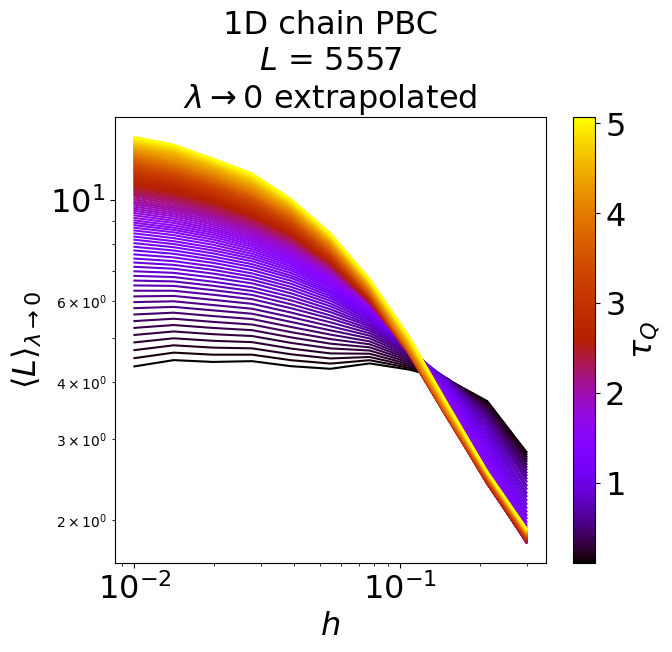

In [34]:
lambdas = np.array([en_to_lambda(e) for e in en_range])

# --- 1) Reorganize datalen into per-(lambda, h) data: tauQ -> <L> ---

lambda_h_data = {}  # (lambda, h) -> {"tauq": [...], "L": [...]}

tauq_cut = 5.1

for tauq in tqsu:
    if tauq >= tauq_cut:
        continue  # skip large tau_Q
    for h in hcojcsu:
        key = (tauq, h)
        if key not in datalen:
            continue

        # datalen[(tauq, h)] is assumed: [(lambda1, L1), (lambda2, L2), ...]
        for lam_val, L_avg in datalen[key]:
            lh_key = (lam_val, h)
            entry = lambda_h_data.setdefault(lh_key, {"tauq": [], "L": []})
            entry["tauq"].append(tauq)
            entry["L"].append(L_avg)

# --- 2) Build interpolation functions f_{lambda,h}(tauQ) ---

interp_funcs = {}  # (lambda, h) -> function(tauQ) -> <L>

for (lam_val, h), data in lambda_h_data.items():
    tauqs = np.array(data["tauq"], dtype=float)
    Ls = np.array(data["L"], dtype=float)

    # sort by tauQ
    sort_idx = np.argsort(tauqs)
    tauqs = tauqs[sort_idx]
    Ls = Ls[sort_idx]

    if tauqs.size < 2:
        # Not enough points to interpolate: treat as constant
        const_val = Ls[0]
        interp_funcs[(lam_val, h)] = lambda x, Lc=const_val: np.full_like(
            np.asarray(x, dtype=float), Lc, dtype=float
        )
    else:
        # Linear interpolation in tauQ (change kind="cubic" if you want)
        interp_funcs[(lam_val, h)] = interp1d(
            tauqs, Ls, kind="linear", bounds_error=False, fill_value="extrapolate"
        )

# --- 3) TauQ grid (100 points over the range of tqsu) ---

tqsu_used = np.array(tqsu)
tqsu_used = tqsu_used[tqsu_used < tauq_cut]

tauq_grid = np.linspace(np.min(tqsu_used), np.max(tqsu_used), 100)


# zero_noise_avg[ti, hi] = c( tauQ_grid[ti], hcojcsu[hi] )
zero_noise_avg = np.full((len(tauq_grid), len(hcojcsu)), np.nan, dtype=float)

def quad_zero_noise(lam, a, c):
    """Model: <L>(lambda) = a * lambda^2 + c."""
    return a * lam**2 + c

# --- 4) For each (tauQ_grid, h), fit a*lambda^2 + c and store c ---

for hi, h in enumerate(hcojcsu):
    for ti, tauq in enumerate(tauq_grid):

        lam_list = []
        L_list = []

        # Collect <L>(lambda) from interpolation functions at this tauQ, h
        for lam in lambdas:
            f = interp_funcs.get((lam, h))
            if f is None:
                continue
            L_interp = float(f(tauq))
            lam_list.append(lam)
            L_list.append(L_interp)

        # Need at least 2 points for a 2-parameter fit (really 3+ is better)
        if len(lam_list) < 2:
            continue

        lam_arr = np.array(lam_list, dtype=float)
        L_arr = np.array(L_list, dtype=float)

        try:
            # Initial guess: a ~ 0, c ~ mean(L)
            p0 = (0.0, float(np.mean(L_arr)))
            popt, pcov = curve_fit(quad_zero_noise, lam_arr, L_arr, p0=p0)
            a_fit, c_fit = popt
            zero_noise_avg[ti, hi] = c_fit
        except RuntimeError:
            # Fit failed; leave NaN
            pass

# Now you have:
# tauq_grid          (100,)
# hcojcsu            (Nh,)
# zero_noise_avg     (100, Nh)  # zero-noise extrapolated <L> for each (tauQ, h)



# third_axis now is the dense tauQ grid from the extrapolation step
third_axis = tauq_grid
third_axis_name = r'$\tau_Q$'

cmap = plt.get_cmap('gnuplot')
colors = [cmap(i) for i in np.linspace(.0, 1., len(third_axis))]

fig, ax = plt.subplots(figsize=(7, 7))

ax.set_xlabel(r"$h$", fontsize=23)
ax.tick_params(axis='x', labelsize=23)
ax.tick_params(axis='y', labelsize=23)
ax.set_ylabel(r"$\langle L \rangle_{\lambda \to 0}$", fontsize=23)
ax.set_title('1D chain PBC\n$L$ = ' + str(L) + '\n' + r'$\lambda \to 0$ extrapolated',
             fontsize=23)

# zero_noise_avg has shape (len(tauq_grid), len(hcojcsu))
for taxind, tax in enumerate(third_axis):
    xtemp = []
    ytemp = []
    for hi, hcojc in enumerate(hcojcsu):
        val = zero_noise_avg[taxind, hi]
        if np.isfinite(val):
            xtemp.append(abs(hcojc))
            ytemp.append(val)

    if len(xtemp) > 0:
        ax.plot(xtemp, ytemp, color=colors[taxind])

fig.tight_layout(pad=2.5)

normalize = mcolors.Normalize(vmin=min(third_axis), vmax=max(third_axis))
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=cmap)
scalarmappaple.set_array(third_axis)
cbar = plt.colorbar(scalarmappaple, ax=ax)
cbar.set_label(label=third_axis_name, size='23')
cbar.ax.tick_params(labelsize='23')

ax.set_xscale('log')
ax.set_yscale('log')

fig.savefig('Figs/1D_More_Samples_avgL_vs_h_ZNE.pdf')